# Psoriasis Single-Cell Validation Analysis
### GSE173706 (scRNA-seq) — Ma, Plazyo, Billi, Tsoi, Ward, Gudjonsson et al., *Nat Commun* 2023

**Purpose:** validate and cell-type-resolve findings from the bulk microarray analysis (GSE14905) used in
*"System-level analysis of gene, pathway and phytochemical associations with psoriasis."*

This notebook:
1. Downloads GSE173706 directly from GEO (no manual upload needed)
2. Builds a QC'd, integrated, annotated single-cell object
3. Runs four analyses that speak directly to the peer-review comments on the manuscript:
   - **A.** Cell-type-resolved expression of the six phytochemical target genes (CCNB1, CDK1, CREB1, CYP1A1, MMP9)
   - **B.** AP-1 (FOS/JUN), CREB1, and interferon-stimulated-gene (ISG) activity by cell type, plus type I vs. III interferon comparison
   - **C.** Pseudobulk differential expression, checked for concordance against your GSE14905 DEG list
   - **D.** Cell-type deconvolution of the GSE14905 bulk samples using this dataset as a reference

**Before you run this:** Runtime → Change runtime type → pick a High-RAM runtime if available. This dataset is
33 samples of raw single-cell counts; the free-tier Colab RAM (12 GB) may be tight during integration/clustering.
`SUBSAMPLE_CELLS_PER_SAMPLE` in Section 2 now defaults to `3000` (capping cells per sample) specifically to
reduce the chance of a crash during Section 5 (scaling + PCA + Harmony) -- set it to `None` if you have a
High-RAM runtime and want to use all cells.

**If your session crashes or disconnects partway through:** Sections 5 and 6 now include a resume-safety
cell that automatically reloads the most recent checkpoint (`adata_postqc.h5ad` or `adata_clustered.h5ad`)
from disk if `adata` isn't found in memory, so you don't need to re-run everything from Section 0 every
time. You still need to re-run Section 5 itself if it crashed mid-way (that step's own checkpoint won't
exist yet), but downstream sections can resume from whatever checkpoint last saved successfully.

**What you need to provide:** in Section 6 (Analysis C), you'll be asked to upload your GSE14905 DEG table
(a CSV with at minimum `gene`, `log2FC`, and `padj` columns — e.g. exported from your Supplementary File 1).
Without it, that section runs in "demo mode" using only the ~20 named genes from your abstract, which is not
a substitute for the real comparison.


## 0. Setup — install packages

In [ ]:
# Core scientific stack (Colab has most of these, but pin versions that play well together)
!pip install -q scanpy==1.10.3 anndata==0.10.9 leidenalg python-igraph
!pip install -q harmonypy==2.0.0
!pip install -q pydeseq2 GEOparse
!pip install -q scikit-learn scipy matplotlib seaborn openpyxl

import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import scipy.sparse as sp
import matplotlib.pyplot as plt
import seaborn as sns
import os, re, gzip, tarfile, gc, io, requests, warnings
warnings.filterwarnings("ignore")

sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=100, facecolor="white")

# Working directories
BASE = "/content/psoriasis_sc"
RAW_DIR = f"{BASE}/raw"
OUT_DIR = f"{BASE}/outputs"
FIG_DIR = f"{OUT_DIR}/figures"
TAB_DIR = f"{OUT_DIR}/tables"
for d in [BASE, RAW_DIR, OUT_DIR, FIG_DIR, TAB_DIR]:
    os.makedirs(d, exist_ok=True)

sc.settings.figdir = FIG_DIR
print("Setup complete. Working directory:", BASE)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 34.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.0/129.0 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 75.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 101.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.6/87.6 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 49.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.6/45.6 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.8/188.8 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.9/118.9 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 95.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.7/363.7 

/usr/local/lib/python3.13/dist-packages/scanpy/_utils/__init__.py:27: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.13/dist-packages/scanpy/__init__.py:32: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  from anndata import (
/usr/local/lib/python3.13/dist-packages/scanpy/__init__.py:32: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  from anndata import (
/usr/local/lib/python3.13/dist-packages/scanpy/__init__.py:32: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  from anndata import (
/usr/local/lib/python3.13/dist-packages/scanpy/__init__.py:32: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  from anndata import (
/usr/local/lib/python3.13/

Setup complete. Working directory: /content/psoriasis_sc


## 1. Download GSE173706 directly from GEO

GEO series page confirms: 33 samples (9 healthy/NS, 11 non-lesional/PN, 13 lesional/PP), processed data
provided as one tarball of per-sample gzipped CSVs (raw gene x cell counts), Cell Ranger v4.0.0, hg38.


In [ ]:
GEO_SERIES = "GSE173706"
FTP_PREFIX = GEO_SERIES[:-3] + "nnn"   # e.g. GSE173706 -> GSE173nnn (NCBI's directory convention)
FTP_MIRROR_URL = f"https://ftp.ncbi.nlm.nih.gov/geo/series/{FTP_PREFIX}/{GEO_SERIES}/suppl/{GEO_SERIES}_RAW.tar"
PORTAL_URL = f"https://www.ncbi.nlm.nih.gov/geo/download/?acc={GEO_SERIES}&format=file"
TAR_PATH = f"{RAW_DIR}/{GEO_SERIES}_RAW.tar"

def try_download(url, dest, chunk_size=1 << 20, min_expected_bytes=5_000_000):
    """Attempts a download; returns True only if the result is a validated, non-trivial tar file.
    A common failure mode is NCBI returning a small HTML/error page instead of the archive --
    this checks size and tar validity explicitly rather than trusting a nonzero byte count."""
    if os.path.exists(dest):
        os.remove(dest)

    print(f"Trying: {url}")
    headers = {"User-Agent": "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 "
                              "(KHTML, like Gecko) Chrome/120.0 Safari/537.36"}
    try:
        with requests.get(url, stream=True, timeout=600, headers=headers, allow_redirects=True) as r:
            r.raise_for_status()
            written = 0
            with open(dest, "wb") as f:
                for chunk in r.iter_content(chunk_size=chunk_size):
                    if chunk:
                        f.write(chunk)
                        written += len(chunk)
    except Exception as e:
        print(f"  Request failed: {e}")
        return False

    print(f"  Downloaded {written/1e6:.1f} MB")

    if written < min_expected_bytes:
        try:
            with open(dest, "rb") as f:
                preview = f.read(300)
            print(f"  File is too small to be the real archive -- likely an error page. First bytes:")
            print(f"  {preview}")
        except Exception:
            pass
        os.remove(dest)
        return False

    if not tarfile.is_tarfile(dest):
        print("  Downloaded file is not a valid tar archive.")
        os.remove(dest)
        return False

    return True

# Skip straight to extraction if a previously-downloaded, valid file already exists
success = os.path.exists(TAR_PATH) and tarfile.is_tarfile(TAR_PATH)
if success:
    print(f"Valid archive already present at {TAR_PATH} -- skipping download.")

if not success:
    success = try_download(FTP_MIRROR_URL, TAR_PATH)

if not success:
    print("\nFTP-mirror download failed or returned an invalid file -- trying the GEO portal URL...")
    success = try_download(PORTAL_URL, TAR_PATH)

if not success:
    print("\nBoth automated download sources failed. Falling back to manual upload.")
    print(f"1. Open https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc={GEO_SERIES} in a browser")
    print("2. Under 'Supplementary file', download GSE173706_RAW.tar")
    print("3. Upload it using the prompt below")
    from google.colab import files
    uploaded = files.upload()
    if uploaded:
        uploaded_name = list(uploaded.keys())[0]
        os.replace(uploaded_name, TAR_PATH)
        success = tarfile.is_tarfile(TAR_PATH)

if not success:
    raise IOError(
        f"Could not obtain a valid {GEO_SERIES}_RAW.tar from any source (automated or manual upload). "
        "Re-run this cell to retry, or check your network/Colab session."
    )

print(f"\nValid tar archive confirmed at {TAR_PATH} ({os.path.getsize(TAR_PATH)/1e6:.1f} MB)")

# Extract the tarball -> individual GSM*.csv.gz files
extract_dir = f"{RAW_DIR}/{GEO_SERIES}_samples"
os.makedirs(extract_dir, exist_ok=True)
if not os.listdir(extract_dir):
    print("Extracting tarball...")
    with tarfile.open(TAR_PATH) as tar:
        tar.extractall(extract_dir)
    print("Extraction complete.")
else:
    print("Already extracted.")

sample_files = sorted([f for f in os.listdir(extract_dir) if f.endswith(".csv.gz")])
print(f"Found {len(sample_files)} per-sample CSV files.")
if len(sample_files) == 0:
    raise RuntimeError(
        "Extraction produced no .csv.gz files -- the archive may be corrupted or structured "
        "differently than expected. Inspect extract_dir contents manually before continuing."
    )
print(sample_files[:5], "...")


Trying: https://ftp.ncbi.nlm.nih.gov/geo/series/GSE173nnn/GSE173706/suppl/GSE173706_RAW.tar
  Downloaded 264.1 MB

Valid tar archive confirmed at /content/psoriasis_sc/raw/GSE173706_RAW.tar (264.1 MB)
Extracting tarball...
Extraction complete.
Found 33 per-sample CSV files.
['GSM5277170_NS-AR001.csv.gz', 'GSM5277171_NS-AR003.csv.gz', 'GSM5277172_NS-AR004.csv.gz', 'GSM5277173_NS-AR005.csv.gz', 'GSM5277174_NS-AR006.csv.gz'] ...


## 2. Parse sample metadata from filenames

Filenames follow the pattern `GSMxxxxxxx_<CONDITION>-<DONOR>.csv.gz`, e.g. `GSM5277189_PP-30696.csv.gz`.
Condition codes: **NS** = healthy/normal skin, **PN** = peripheral non-lesional psoriatic skin,
**PP** = psoriatic lesional skin.


In [ ]:
# --- Tunable parameters ---
SUBSAMPLE_CELLS_PER_SAMPLE = 1500   # caps cells/sample to keep Section 5 (scale+PCA+Harmony) within
                                     # free-tier Colab RAM. Set to None to use all cells if you have
                                     # a High-RAM runtime; increase gradually if you want more cells
                                     # and your session isn't crashing.
MIN_GENES_PER_CELL = 200
MAX_PCT_MITO = 20
MIN_CELLS_PER_GENE = 3

def parse_sample_meta(filename):
    """GSM5277189_PP-30696.csv.gz -> (gsm_id, condition, donor)"""
    m = re.match(r"(GSM\d+)_([A-Z]+)-(.+)\.csv\.gz", filename)
    if not m:
        raise ValueError(f"Could not parse filename: {filename}")
    gsm_id, condition, donor = m.groups()
    return gsm_id, condition, donor

meta_rows = []
for f in sample_files:
    gsm_id, condition, donor = parse_sample_meta(f)
    meta_rows.append({"file": f, "gsm_id": gsm_id, "condition": condition, "donor": donor})

sample_meta = pd.DataFrame(meta_rows)
print(sample_meta["condition"].value_counts())
sample_meta.to_csv(f"{TAB_DIR}/sample_metadata.csv", index=False)
sample_meta.head(10)


condition
PP    14
PN    11
NS     8
Name: count, dtype: int64


,file,gsm_id,condition,donor
0,GSM5277170_NS-AR001.csv.gz,GSM5277170,NS,AR001
1,GSM5277171_NS-AR003.csv.gz,GSM5277171,NS,AR003
2,GSM5277172_NS-AR004.csv.gz,GSM5277172,NS,AR004
3,GSM5277173_NS-AR005.csv.gz,GSM5277173,NS,AR005
4,GSM5277174_NS-AR006.csv.gz,GSM5277174,NS,AR006
5,GSM5277175_NS-AR007.csv.gz,GSM5277175,NS,AR007
6,GSM5277176_NS-AR008.csv.gz,GSM5277176,NS,AR008
7,GSM5277177_NS-AR009.csv.gz,GSM5277177,NS,AR009
8,GSM5277178_PN-30696.csv.gz,GSM5277178,PN,30696
9,GSM5277179_PN-30696V3.csv.gz,GSM5277179,PN,30696V3


## 3. Load each sample's count matrix into AnnData

The CSVs are exported as genes (rows) x cells (columns), per GSE173706's own description on GEO.
The loader below peeks at each file's header first (cheap -- no data rows read) to get the cell
count and barcode names, then reads **only** the subsampled subset of cell columns directly via
`usecols`. This is important for memory: reading the full dense matrix first and subsampling
afterward (the earlier approach) meant `SUBSAMPLE_CELLS_PER_SAMPLE` had no effect on peak memory
during the read itself, which is what was causing RAM-exhaustion crashes on larger samples.


In [ ]:
def load_sample_csv(path, gsm_id, condition, donor, subsample=None, seed=0):
    # Peek at the header only -- this reads zero data rows, just column names -- to get the
    # cell barcode list and total cell count before deciding what to actually load.
    raw_header = pd.read_csv(path, nrows=0)
    all_columns = raw_header.columns.tolist()
    gene_col_name = all_columns[0]
    cell_columns_all = all_columns[1:]
    n_cells_in_file = len(cell_columns_all)

    if n_cells_in_file > 15000:
        print(f"  WARNING: {n_cells_in_file} columns detected in {path} -- unusually high for a "
              f"per-sample cell count (GSE173706 samples are typically far fewer). This may mean "
              f"genes are stored as columns rather than rows for this file -- inspect it manually "
              f"if downstream gene/cell counts look wrong.")

    # Decide which cell columns to keep BEFORE reading any data -- this is the actual fix.
    if subsample is not None and n_cells_in_file > subsample:
        rng = np.random.default_rng(seed)
        selected_cells = sorted(rng.choice(cell_columns_all, size=subsample, replace=False).tolist())
    else:
        selected_cells = cell_columns_all

    # Read ONLY the selected columns, and only as float32 (half the memory of pandas' default
    # float64) -- the full dense matrix for unselected cells is never materialized at all.
    usecols = [gene_col_name] + selected_cells
    dtype_map = {c: np.float32 for c in selected_cells}
    df = pd.read_csv(path, usecols=usecols, index_col=gene_col_name, dtype=dtype_map)

    genes = df.index.astype(str)
    cells = df.columns.astype(str)

    X = sp.csr_matrix(df.values.T)  # already float32; cells x genes, sparse
    del df
    gc.collect()

    obs = pd.DataFrame({
        "sample": f"{condition}-{donor}",
        "gsm_id": gsm_id,
        "condition": condition,
        "donor": donor,
    }, index=[f"{gsm_id}_{c}" for c in cells])

    var = pd.DataFrame(index=genes)
    adata = ad.AnnData(X=X, obs=obs, var=var)
    adata.var_names_make_unique()

    return adata

adatas = []
for _, row in sample_meta.iterrows():
    path = os.path.join(extract_dir, row["file"])
    print(f"Loading {row['file']} ...", end=" ")
    try:
        a = load_sample_csv(path, row["gsm_id"], row["condition"], row["donor"],
                             subsample=SUBSAMPLE_CELLS_PER_SAMPLE)
        print(f"{a.n_obs} cells x {a.n_vars} genes")
        adatas.append(a)
    except Exception as e:
        print(f"FAILED: {e}")

print(f"\nLoaded {len(adatas)} / {len(sample_meta)} samples successfully.")


Loading GSM5277170_NS-AR001.csv.gz ... 1148 cells x 33538 genes
Loading GSM5277171_NS-AR003.csv.gz ... 1500 cells x 33538 genes
Loading GSM5277172_NS-AR004.csv.gz ... 1156 cells x 33538 genes
Loading GSM5277173_NS-AR005.csv.gz ... 1064 cells x 33538 genes
Loading GSM5277174_NS-AR006.csv.gz ... 1500 cells x 33538 genes
Loading GSM5277175_NS-AR007.csv.gz ... 1500 cells x 33538 genes
Loading GSM5277176_NS-AR008.csv.gz ... 208 cells x 33538 genes
Loading GSM5277177_NS-AR009.csv.gz ... 1500 cells x 33538 genes
Loading GSM5277178_PN-30696.csv.gz ... 1500 cells x 33538 genes
Loading GSM5277179_PN-30696V3.csv.gz ... 1500 cells x 33538 genes
Loading GSM5277180_PN-31170.csv.gz ... 1500 cells x 33538 genes
Loading GSM5277181_PN-31277.csv.gz ... 1500 cells x 33538 genes
Loading GSM5277182_PN-369PC.csv.gz ... 1367 cells x 33538 genes
Loading GSM5277183_PN-5851.csv.gz ... 1500 cells x 33538 genes
Loading GSM5277184_PN-7802ED.csv.gz ... 1500 cells x 33538 genes
Loading GSM5277185_PN-8659ED.csv.gz ...

In [ ]:
# Concatenate all samples into one AnnData object
adata = ad.concat(adatas, join="outer", fill_value=0, index_unique=None)
adata.obs_names_make_unique()
del adatas
gc.collect()

print(adata)
print(adata.obs["condition"].value_counts())


AnnData object with n_obs × n_vars = 46023 × 33538
    obs: 'sample', 'gsm_id', 'condition', 'donor'
    layers: None (.X)
condition
PP    20653
PN    15794
NS     9576
Name: count, dtype: int64


### 3b. Map Ensembl gene IDs to gene symbols

**Important:** GSE173706's raw per-sample CSVs are indexed by Ensembl gene IDs (e.g. `ENSG00000170312`),
not gene symbols. Every downstream step in this notebook -- QC, clustering, marker-based cell-type
annotation, and especially the target-gene analyses in Sections 7-8 -- depends on matching plain gene
symbols like `CDK1` or `CREB1`. Without this mapping step, those lookups silently return nothing, which
is why target genes may otherwise appear to be "not found" even though the underlying data is fine.

This uses `mygene` (queries mygene.info, a free public gene-annotation service) to batch-map all Ensembl
IDs to HGNC symbols in one pass, right after concatenation and before any QC/analysis happens, so every
later cell in the notebook operates on symbols.


In [ ]:
!pip install -q mygene
import mygene

print(f"Mapping {adata.n_vars} Ensembl gene IDs to gene symbols via mygene.info ...")
mg = mygene.MyGeneInfo()

ensembl_ids = list(adata.var_names)

# Query in batches to keep individual requests a manageable size
BATCH_SIZE = 1000
ens_to_symbol = {}
unmapped_ids = []

for i in range(0, len(ensembl_ids), BATCH_SIZE):
    batch = ensembl_ids[i:i + BATCH_SIZE]
    print(f"  Querying genes {i} - {i + len(batch)} of {len(ensembl_ids)} ...")
    results = mg.querymany(batch, scopes="ensembl.gene", fields="symbol", species="human", verbose=False)
    for r in results:
        if r.get("notfound") or "symbol" not in r:
            unmapped_ids.append(r["query"])
        else:
            # a given Ensembl ID can occasionally return multiple hits; take the first
            symbol = r["symbol"] if isinstance(r["symbol"], str) else r["symbol"][0]
            ens_to_symbol[r["query"]] = symbol

n_mapped = len(ens_to_symbol)
n_unmapped = len(set(ensembl_ids) - set(ens_to_symbol.keys()))
print(f"\nMapped {n_mapped} / {len(ensembl_ids)} genes to symbols ({n_unmapped} unmapped).")

if n_mapped == 0:
    raise RuntimeError(
        "No Ensembl IDs were successfully mapped to gene symbols. This usually means the "
        "mygene.info API call failed entirely (check network/firewall) rather than that no "
        "genes matched -- inspect the raw 'results' output above before proceeding."
    )

# Check for duplicate symbol targets (multiple Ensembl IDs mapping to the same gene symbol,
# e.g. due to gene model updates or readthrough transcripts) -- these need collapsing.
from collections import Counter
symbol_counts = Counter(ens_to_symbol.values())
n_duplicated_symbols = sum(1 for c in symbol_counts.values() if c > 1)
if n_duplicated_symbols > 0:
    print(f"NOTE: {n_duplicated_symbols} gene symbols are targeted by more than one Ensembl ID -- "
          "will be collapsed (summed) during the mapping below.")

# Build the new var index: mapped symbol where available, otherwise fall back to the original
# Ensembl ID so no gene is silently dropped from the object at this stage.
adata.var["ensembl_id"] = adata.var_names
adata.var["gene_symbol"] = adata.var_names.map(ens_to_symbol)
adata.var["final_name"] = adata.var["gene_symbol"].fillna(adata.var["ensembl_id"])

# Collapse duplicate symbols by summing counts across the Ensembl IDs that map to them
var_names_arr = adata.var["final_name"].values
unique_names, inverse = np.unique(var_names_arr, return_inverse=True)

if len(unique_names) < len(var_names_arr):
    print(f"Collapsing {len(var_names_arr)} entries into {len(unique_names)} unique gene symbols...")
    from scipy.sparse import coo_matrix
    n_orig = len(var_names_arr)
    n_unique = len(unique_names)
    # Sparse grouping matrix (n_orig x n_unique): 1 where an original entry maps to a given symbol.
    # X @ group_matrix sums counts across all original columns sharing the same final symbol.
    group_matrix = coo_matrix(
        (np.ones(n_orig), (np.arange(n_orig), inverse)), shape=(n_orig, n_unique)
    ).tocsr()
    X_collapsed = sp.csr_matrix(adata.X).dot(group_matrix)
    new_var = pd.DataFrame(index=unique_names)
    adata = ad.AnnData(X=sp.csr_matrix(X_collapsed), obs=adata.obs.copy(), var=new_var)
else:
    adata.var_names = unique_names[inverse]

adata.var_names_make_unique()
print(f"\nFinal adata after symbol mapping: {adata.n_obs} cells x {adata.n_vars} genes")

# Sanity check: confirm the six phytochemical target genes are now resolvable by symbol
_check_genes = ["CCNB1", "CDK1", "CREB1", "CYP1A1", "MMP9"]
_found = [g for g in _check_genes if g in adata.var_names]
_missing = set(_check_genes) - set(_found)
print(f"Target gene check after mapping -- found: {_found}")
if _missing:
    print(f"Still missing after mapping (likely genuine low-abundance dropout, not a naming issue): {_missing}")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.1/52.1 kB 2.6 MB/s eta 0:00:00
Mapping 33538 Ensembl gene IDs to gene symbols via mygene.info ...
  Querying genes 0 - 1000 of 33538 ...
  Querying genes 1000 - 2000 of 33538 ...
  Querying genes 2000 - 3000 of 33538 ...
  Querying genes 3000 - 4000 of 33538 ...
  Querying genes 4000 - 5000 of 33538 ...
  Querying genes 5000 - 6000 of 33538 ...
  Querying genes 6000 - 7000 of 33538 ...
  Querying genes 7000 - 8000 of 33538 ...
  Querying genes 8000 - 9000 of 33538 ...
  Querying genes 9000 - 10000 of 33538 ...
  Querying genes 10000 - 11000 of 33538 ...
  Querying genes 11000 - 12000 of 33538 ...
  Querying genes 12000 - 13000 of 33538 ...
  Querying genes 13000 - 14000 of 33538 ...
  Querying genes 14000 - 15000 of 33538 ...
  Querying genes 15000 - 16000 of 33538 ...
  Querying genes 16000 - 17000 of 33538 ...
  Querying genes 17000 - 18000 of 33538 ...
  Querying genes 18000 - 19000 of 33538 ...
  Querying genes 19000 - 20000 of 33538 .

## 4. Quality control and filtering

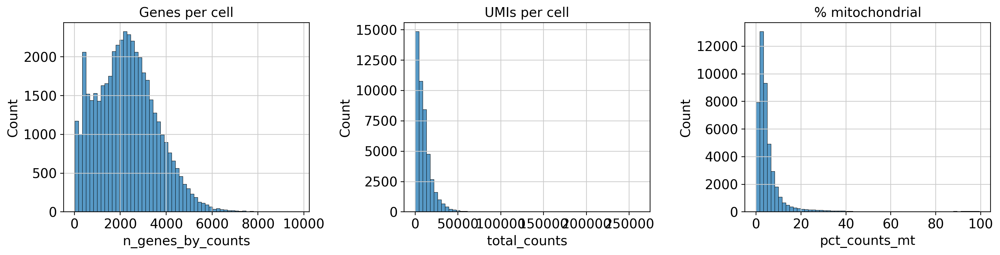

Cells before/after QC filtering: 46023 -> 42670
Genes retained: 25041


In [ ]:
adata.var["mt"] = adata.var_names.str.upper().str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
sns.histplot(adata.obs["n_genes_by_counts"], bins=60, ax=axes[0]); axes[0].set_title("Genes per cell")
sns.histplot(adata.obs["total_counts"], bins=60, ax=axes[1]); axes[1].set_title("UMIs per cell")
sns.histplot(adata.obs["pct_counts_mt"], bins=60, ax=axes[2]); axes[2].set_title("% mitochondrial")
plt.tight_layout()
plt.savefig(f"{FIG_DIR}/qc_prefilter.png", dpi=150)
plt.show()

n_before = adata.n_obs
adata = adata[adata.obs["n_genes_by_counts"] >= MIN_GENES_PER_CELL, :]
adata = adata[adata.obs["pct_counts_mt"] < MAX_PCT_MITO, :]
sc.pp.filter_genes(adata, min_cells=MIN_CELLS_PER_GENE)
print(f"Cells before/after QC filtering: {n_before} -> {adata.n_obs}")
print(f"Genes retained: {adata.n_vars}")

adata.write(f"{OUT_DIR}/adata_postqc.h5ad")


## 5. Normalization, dimensionality reduction, batch integration, clustering

**Resume-safety check:** if your Colab session crashed or restarted since the last cell ran,
`adata` may not exist in memory anymore even though the QC step already completed and saved a
checkpoint to disk. This cell reloads that checkpoint automatically instead of forcing a full
re-run from Section 0 -- but only if you've already run Section 4 successfully at least once.


In [ ]:
POSTQC_CHECKPOINT = f"{OUT_DIR}/adata_postqc.h5ad"

if "adata" not in dir():
    if os.path.exists(POSTQC_CHECKPOINT):
        print(f"'adata' not found in memory (likely a session restart) -- reloading checkpoint:")
        print(f"  {POSTQC_CHECKPOINT}")
        adata = sc.read_h5ad(POSTQC_CHECKPOINT)
        print(adata)
    else:
        raise RuntimeError(
            "'adata' is not defined and no post-QC checkpoint was found on disk. "
            "This means Sections 0-4 haven't completed in this session yet. "
            "Run Runtime > Run all from the top (or run Sections 0-4 manually, in order) "
            "before continuing to this cell."
        )
else:
    print("'adata' already in memory -- continuing without reload.")


'adata' already in memory -- continuing without reload.


2026-09-08 11:34:25,972 - harmonypy - INFO - Running Harmony
INFO:harmonypy:Running Harmony
2026-09-08 11:34:25,974 - harmonypy - INFO -   Parameters:
INFO:harmonypy:  Parameters:
2026-09-08 11:34:25,975 - harmonypy - INFO -     max_iter_harmony: 10
INFO:harmonypy:    max_iter_harmony: 10
2026-09-08 11:34:25,977 - harmonypy - INFO -     max_iter_kmeans: 4
INFO:harmonypy:    max_iter_kmeans: 4
2026-09-08 11:34:25,979 - harmonypy - INFO -     epsilon_cluster: 0.001
INFO:harmonypy:    epsilon_cluster: 0.001
2026-09-08 11:34:25,981 - harmonypy - INFO -     epsilon_harmony: 0.01
INFO:harmonypy:    epsilon_harmony: 0.01
2026-09-08 11:34:25,983 - harmonypy - INFO -     nclust: 100
INFO:harmonypy:    nclust: 100
2026-09-08 11:34:25,985 - harmonypy - INFO -     block_size: 0.05
INFO:harmonypy:    block_size: 0.05
2026-09-08 11:34:25,986 - harmonypy - INFO -     lamb: dynamic (alpha=0.2)
INFO:harmonypy:    lamb: dynamic (alpha=0.2)
2026-09-08 11:34:25,989 - harmonypy - INFO -     theta: [2. 2. 2

Input to Harmony: 42670 cells x 30 PCs


2026-09-08 11:34:29,122 - harmonypy - INFO - Initialization complete.
INFO:harmonypy:Initialization complete.
2026-09-08 11:34:29,123 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2026-09-08 11:34:30,521 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2026-09-08 11:34:31,797 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2026-09-08 11:34:33,051 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2026-09-08 11:34:34,298 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2026-09-08 11:34:35,554 - harmonypy - INFO - Iteration 6 of 10
INFO:harmonypy:Iteration 6 of 10
2026-09-08 11:34:36,805 - harmonypy - INFO - Iteration 7 of 10
INFO:harmonypy:Iteration 7 of 10
2026-09-08 11:34:38,076 - harmonypy - INFO - Iteration 8 of 10
INFO:harmonypy:Iteration 8 of 10
2026-09-08 11:34:39,329 - harmonypy - INFO - Iteration 9 of 10
INFO:harmonypy:Iteration 9 of 10
2026-09-08 11:34:41,345 - 

Harmony-corrected embedding stored: 42670 cells x 30 dims


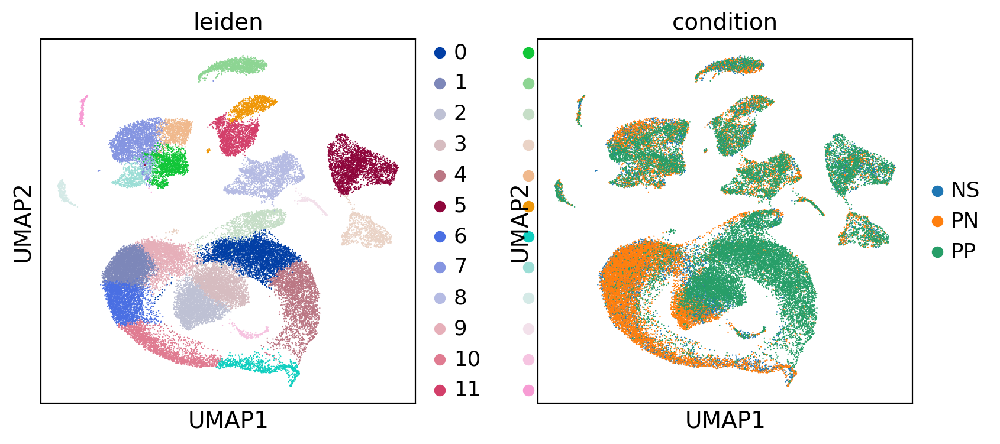

In [ ]:
adata.layers["counts"] = adata.X.copy()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
# NOTE: removed `adata.raw = adata` here on purpose -- nothing downstream (Sections 7-10)
# reads .raw, they all use adata.X or adata.layers["counts"] directly. Keeping it made a
# full duplicate copy of the log-normalized matrix, and that duplicate then rode along
# into adata_hvg's .copy() below too, tripling effective memory use for no benefit.

sc.pp.highly_variable_genes(adata, n_top_genes=1000, batch_key="donor")
# n_top_genes lowered from 2000 -> 1000 to shrink the dense matrix used for scale+PCA.
adata_hvg = adata[:, adata.var["highly_variable"]].copy()

# Free the full-gene adata object while we do the RAM-heavy scale/PCA/Harmony steps on
# adata_hvg -- adata isn't needed again until we carry results back onto it below.
PREHVG_CHECKPOINT = f"{OUT_DIR}/adata_prehvg_temp.h5ad"
adata.write(PREHVG_CHECKPOINT)
del adata
gc.collect()

sc.pp.scale(adata_hvg, max_value=10)
sc.tl.pca(adata_hvg, n_comps=30, svd_solver="arpack")

# Harmony integration across donors to avoid patient-driven clustering.
# Calling harmonypy directly (rather than scanpy.external.pp.harmony_integrate) to avoid
# depending on scanpy's external-module import path, which has had version-compatibility issues.
import harmonypy as hpy

X_pca_data = adata_hvg.obsm["X_pca"]          # shape: (n_cells, n_comps) -- this is what harmonypy expects as input
meta_data_obs = adata_hvg.obs

print(f"Input to Harmony: {X_pca_data.shape[0]} cells x {X_pca_data.shape[1]} PCs")

harmony_out = hpy.run_harmony(X_pca_data, meta_data_obs, ["donor"])

# harmonypy's Z_corr orientation has differed across package versions:
# older harmonypy (~0.x, what scanpy's own harmony_integrate wrapper assumes) returns
# (n_PCs, n_cells); harmonypy 2.0.0 (pinned above) returns (n_cells, n_PCs) directly.
# Detecting the orientation at runtime rather than hardcoding a transpose avoids silently
# breaking again if the installed version changes.
Z = harmony_out.Z_corr
if Z.shape[0] == X_pca_data.shape[0]:
    X_harmony = Z          # already (n_cells, n_PCs) -- no transpose needed
elif Z.shape[1] == X_pca_data.shape[0]:
    X_harmony = Z.T        # was (n_PCs, n_cells) -- transpose to (n_cells, n_PCs)
else:
    raise ValueError(
        f"Harmony output shape {Z.shape} does not match {X_pca_data.shape[0]} cells "
        "on either axis -- cannot determine orientation. Check the harmonypy version "
        "(`import harmonypy; print(harmonypy.__version__)`) against what this cell expects."
    )

assert X_harmony.shape[0] == adata_hvg.n_obs, (
    f"Harmony output has {X_harmony.shape[0]} rows but adata_hvg has {adata_hvg.n_obs} cells -- "
    "shape mismatch, do not proceed."
)

adata_hvg.obsm["X_pca_harmony"] = X_harmony
print(f"Harmony-corrected embedding stored: {X_harmony.shape[0]} cells x {X_harmony.shape[1]} dims")

sc.pp.neighbors(adata_hvg, use_rep="X_pca_harmony", n_neighbors=15)
sc.tl.leiden(adata_hvg, resolution=1.0, key_added="leiden")
sc.tl.umap(adata_hvg)

# Reload the full-gene adata we set aside earlier, then carry the clustering/embedding
# results from adata_hvg back onto it.
adata = sc.read_h5ad(PREHVG_CHECKPOINT)
adata.obsm["X_pca_harmony"] = adata_hvg.obsm["X_pca_harmony"]
adata.obsm["X_umap"] = adata_hvg.obsm["X_umap"]
adata.obs["leiden"] = adata_hvg.obs["leiden"].values

sc.pl.umap(adata, color=["leiden", "condition"], save="_leiden_condition.png", show=True)

del adata_hvg
gc.collect()
adata.write(f"{OUT_DIR}/adata_clustered.h5ad")

# Clean up the temporary checkpoint now that it's no longer needed
if os.path.exists(PREHVG_CHECKPOINT):
    os.remove(PREHVG_CHECKPOINT)

2026-09-08 11:40:48,431 - harmonypy - INFO - Running Harmony
INFO:harmonypy:Running Harmony
2026-09-08 11:40:48,433 - harmonypy - INFO -   Parameters:
INFO:harmonypy:  Parameters:
2026-09-08 11:40:48,434 - harmonypy - INFO -     max_iter_harmony: 10
INFO:harmonypy:    max_iter_harmony: 10
2026-09-08 11:40:48,436 - harmonypy - INFO -     max_iter_kmeans: 4
INFO:harmonypy:    max_iter_kmeans: 4
2026-09-08 11:40:48,438 - harmonypy - INFO -     epsilon_cluster: 0.001
INFO:harmonypy:    epsilon_cluster: 0.001
2026-09-08 11:40:48,440 - harmonypy - INFO -     epsilon_harmony: 0.01
INFO:harmonypy:    epsilon_harmony: 0.01
2026-09-08 11:40:48,442 - harmonypy - INFO -     nclust: 100
INFO:harmonypy:    nclust: 100
2026-09-08 11:40:48,444 - harmonypy - INFO -     block_size: 0.05
INFO:harmonypy:    block_size: 0.05
2026-09-08 11:40:48,445 - harmonypy - INFO -     lamb: dynamic (alpha=0.2)
INFO:harmonypy:    lamb: dynamic (alpha=0.2)
2026-09-08 11:40:48,448 - harmonypy - INFO -     theta: [2. 2. 2

Input to Harmony: 42670 cells x 30 PCs


2026-09-08 11:40:48,530 - harmonypy - INFO - Computing initial centroids...
INFO:harmonypy:Computing initial centroids...
2026-09-08 11:40:50,910 - harmonypy - INFO - Initialization complete.
INFO:harmonypy:Initialization complete.
2026-09-08 11:40:50,918 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2026-09-08 11:40:52,122 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2026-09-08 11:40:53,439 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2026-09-08 11:40:54,710 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2026-09-08 11:40:56,018 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2026-09-08 11:40:57,304 - harmonypy - INFO - Iteration 6 of 10
INFO:harmonypy:Iteration 6 of 10
2026-09-08 11:40:58,599 - harmonypy - INFO - Iteration 7 of 10
INFO:harmonypy:Iteration 7 of 10
2026-09-08 11:40:59,874 - harmonypy - INFO - Iteration 8 of 10
INFO:harmonypy:Iteration 8 of 10


Harmony-corrected embedding stored: 42670 cells x 30 dims


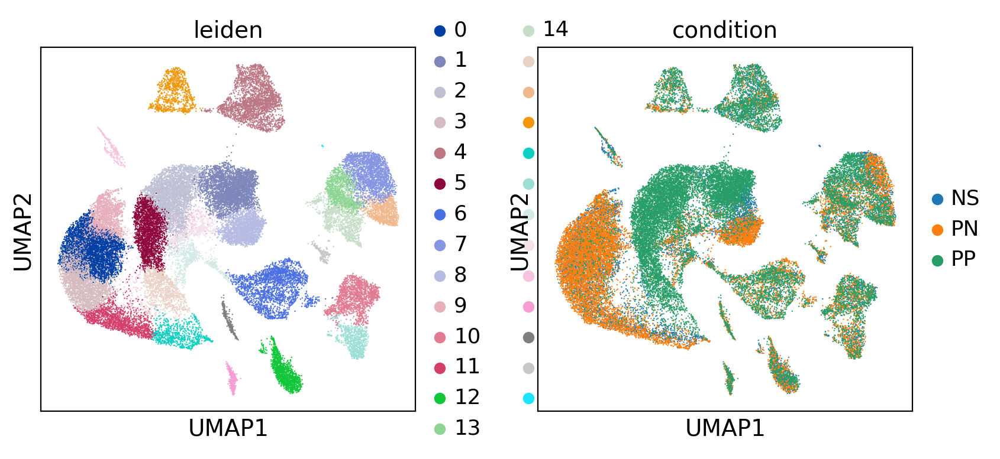

In [ ]:
adata.layers["counts"] = adata.X.copy()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="donor")
adata_hvg = adata[:, adata.var["highly_variable"]].copy()

sc.pp.scale(adata_hvg, max_value=10)
sc.tl.pca(adata_hvg, n_comps=30, svd_solver="arpack")

# Harmony integration across donors to avoid patient-driven clustering.
# Calling harmonypy directly (rather than scanpy.external.pp.harmony_integrate) to avoid
# depending on scanpy's external-module import path, which has had version-compatibility issues.
import harmonypy as hpy

X_pca_data = adata_hvg.obsm["X_pca"]          # shape: (n_cells, n_comps) -- this is what harmonypy expects as input
meta_data_obs = adata_hvg.obs

print(f"Input to Harmony: {X_pca_data.shape[0]} cells x {X_pca_data.shape[1]} PCs")

harmony_out = hpy.run_harmony(X_pca_data, meta_data_obs, ["donor"])

# harmonypy's Z_corr orientation has differed across package versions:
# older harmonypy (~0.x, what scanpy's own harmony_integrate wrapper assumes) returns
# (n_PCs, n_cells); harmonypy 2.0.0 (pinned above) returns (n_cells, n_PCs) directly.
# Detecting the orientation at runtime rather than hardcoding a transpose avoids silently
# breaking again if the installed version changes.
Z = harmony_out.Z_corr
if Z.shape[0] == X_pca_data.shape[0]:
    X_harmony = Z          # already (n_cells, n_PCs) -- no transpose needed
elif Z.shape[1] == X_pca_data.shape[0]:
    X_harmony = Z.T        # was (n_PCs, n_cells) -- transpose to (n_cells, n_PCs)
else:
    raise ValueError(
        f"Harmony output shape {Z.shape} does not match {X_pca_data.shape[0]} cells "
        "on either axis -- cannot determine orientation. Check the harmonypy version "
        "(`import harmonypy; print(harmonypy.__version__)`) against what this cell expects."
    )

assert X_harmony.shape[0] == adata_hvg.n_obs, (
    f"Harmony output has {X_harmony.shape[0]} rows but adata_hvg has {adata_hvg.n_obs} cells -- "
    "shape mismatch, do not proceed."
)

adata_hvg.obsm["X_pca_harmony"] = X_harmony
print(f"Harmony-corrected embedding stored: {X_harmony.shape[0]} cells x {X_harmony.shape[1]} dims")

sc.pp.neighbors(adata_hvg, use_rep="X_pca_harmony", n_neighbors=15)
sc.tl.leiden(adata_hvg, resolution=1.0, key_added="leiden")
sc.tl.umap(adata_hvg)

# carry results back onto the full (non-HVG-subset) object for downstream marker-gene work
adata.obsm["X_pca_harmony"] = adata_hvg.obsm["X_pca_harmony"]
adata.obsm["X_umap"] = adata_hvg.obsm["X_umap"]
adata.obs["leiden"] = adata_hvg.obs["leiden"].values

sc.pl.umap(adata, color=["leiden", "condition"], save="_leiden_condition.png", show=True)

del adata_hvg
gc.collect()
adata.write(f"{OUT_DIR}/adata_clustered.h5ad")


## 6. Cell-type annotation

Using the marker gene sets reported in the source paper (Ma et al., *Nat Commun* 2023, Fig. 1c) so the
annotation matches the original study rather than inventing new cell-type calls.

**Resume-safety check:** same as above -- if `adata` (with clustering already done) isn't in memory,
reload it from the Section 5 checkpoint rather than needing to re-run the expensive Harmony step.


In [ ]:
CLUSTERED_CHECKPOINT = f"{OUT_DIR}/adata_clustered.h5ad"

if "adata" not in dir() or "leiden" not in adata.obs.columns:
    if os.path.exists(CLUSTERED_CHECKPOINT):
        print(f"'adata' missing or not yet clustered -- reloading checkpoint:")
        print(f"  {CLUSTERED_CHECKPOINT}")
        adata = sc.read_h5ad(CLUSTERED_CHECKPOINT)
        print(adata)
    else:
        raise RuntimeError(
            "'adata' is not defined (or has no 'leiden' clusters) and no clustered checkpoint "
            "was found on disk. This means Section 5 hasn't completed successfully in this "
            "session yet. Run Runtime > Run all from the top, or run Section 5 manually and "
            "confirm it finishes without error before continuing to this cell."
        )
else:
    print("'adata' already in memory with clustering -- continuing without reload.")


'adata' already in memory with clustering -- continuing without reload.


        score_Keratinocyte  score_Melanocyte  score_Eccrine_gland  \
leiden                                                              
0                    0.932            -0.079               -0.018   
1                    0.027            -0.095               -0.057   
2                    1.063            -0.084               -0.031   
3                    0.690            -0.096               -0.029   
4                   -0.353            -0.066               -0.018   
5                    1.078            -0.077                0.064   
6                   -0.450            -0.093               -0.021   
7                   -0.708            -0.157               -0.062   
8                    0.388            -0.087               -0.028   
9                    1.219            -0.098               -0.033   
10                  -0.491            -0.080               -0.015   
11                   0.694            -0.072               -0.028   
12                  -0.564        

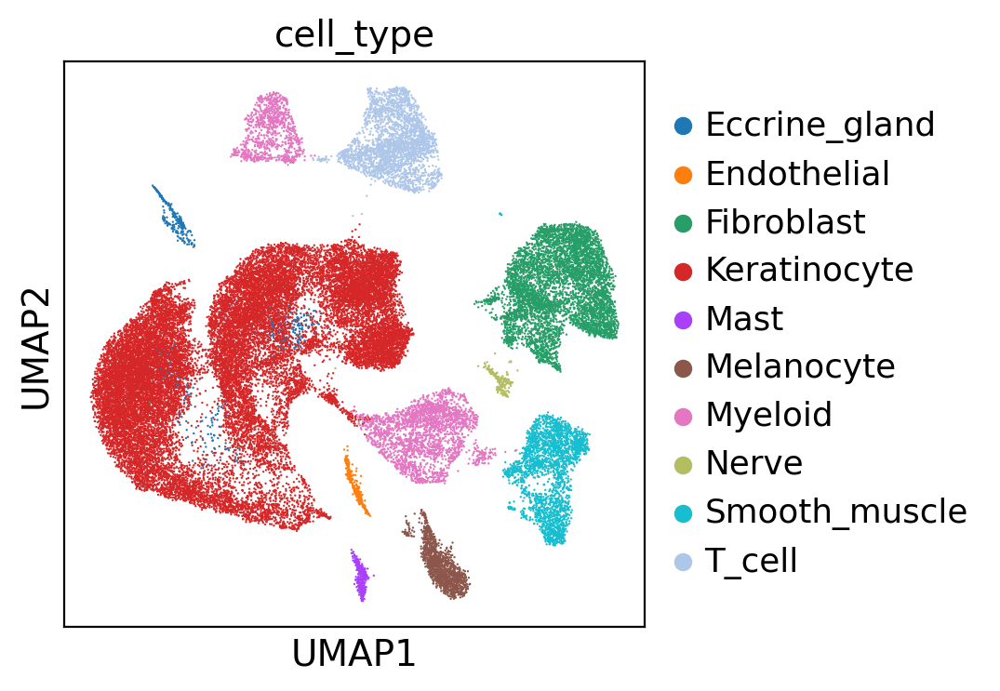

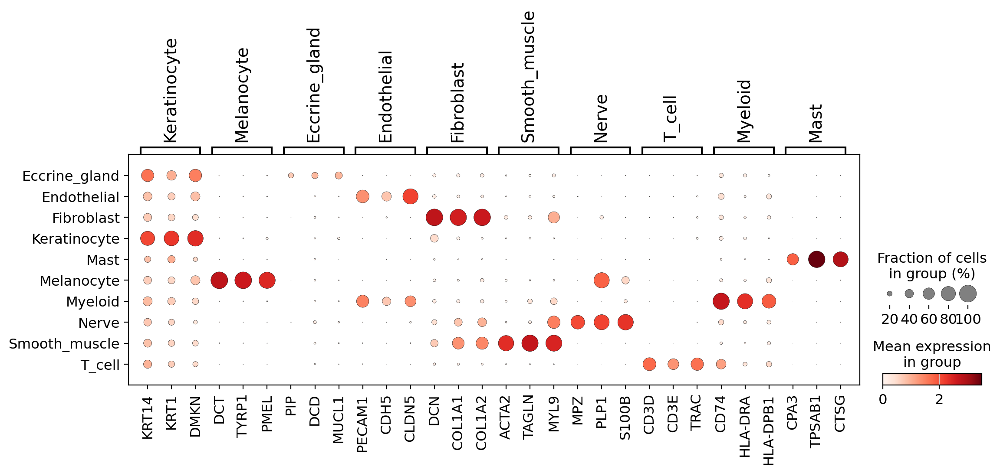

In [ ]:
MARKERS = {
    "Keratinocyte": ["KRT14", "KRT1", "DMKN"],
    "Melanocyte": ["DCT", "TYRP1", "PMEL"],
    "Eccrine_gland": ["PIP", "DCD", "MUCL1"],
    "Endothelial": ["PECAM1", "CDH5", "CLDN5"],
    "Fibroblast": ["DCN", "COL1A1", "COL1A2"],
    "Smooth_muscle": ["ACTA2", "TAGLN", "MYL9"],
    "Nerve": ["MPZ", "PLP1", "S100B"],
    "T_cell": ["CD3D", "CD3E", "TRAC"],
    "Myeloid": ["CD74", "HLA-DRA", "HLA-DPB1"],
    "Mast": ["CPA3", "TPSAB1", "CTSG"],
}

# Case-insensitive lookup, in case gene symbols in this dataset differ in capitalization
# from the canonical HGNC symbols used above.
adata_gene_names_upper_map = {name.upper(): name for name in adata.var_names}

for ct, genes in MARKERS.items():
    genes_present = [adata_gene_names_upper_map[g.upper()] for g in genes if g.upper() in adata_gene_names_upper_map]
    if len(genes_present) == 0:
        print(f"WARNING: none of {genes} found (case-insensitively) for {ct} -- skipping score")
        continue
    sc.tl.score_genes(adata, genes_present, score_name=f"score_{ct}")

score_cols = [c for c in adata.obs.columns if c.startswith("score_")]

if not score_cols:
    print("\nERROR: No cell type scores were successfully computed. All marker genes were missing.")
    print("Cannot proceed with cell type assignment, UMAP plotting, or dotplot.")
    adata.obs["cell_type"] = "Unassigned"
else:
    cluster_scores = adata.obs.groupby("leiden")[score_cols].mean()
    cluster_assignment = cluster_scores.idxmax(axis=1).str.replace("score_", "", regex=False)
    print(cluster_scores.round(3))
    print("\nCluster -> cell type assignment:")
    print(cluster_assignment)

    adata.obs["cell_type"] = adata.obs["leiden"].map(cluster_assignment).astype("category")

    sc.pl.umap(adata, color="cell_type", save="_celltype.png", show=True)
    sc.pl.dotplot(adata, MARKERS, groupby="cell_type", save="_marker_dotplot.png", show=True)

    adata.obs[["sample", "condition", "donor", "leiden", "cell_type"]].to_csv(f"{TAB_DIR}/cell_annotations.csv")
    adata.write(f"{OUT_DIR}/adata_annotated.h5ad")


### 6b. Sanity check — unbiased, all-genes marker discovery per cluster

The annotation above used a small, curated set of canonical markers (matching the source paper's own
cell-type calls). This cell runs the complementary check: an unbiased differential-expression test
across **all genes** (not a pre-selected list) for each Leiden cluster, so you can confirm the
unbiased top genes for each cluster actually agree with the canonical markers used to name it above.
If a cluster's real top DE genes don't match its assigned label, that's worth investigating before
trusting the downstream cell-type-resolved analyses (Sections 7-10).


In [ ]:
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon", n_genes=15)

top_genes_per_cluster = pd.DataFrame(adata.uns["rank_genes_groups"]["names"])
top_genes_per_cluster.columns = [f"cluster_{c}" for c in top_genes_per_cluster.columns]
top_genes_per_cluster.to_csv(f"{TAB_DIR}/top_DE_genes_per_leiden_cluster.csv", index=False)

print("Top 15 unbiased marker genes per Leiden cluster (all genes considered, not just MARKERS above):")
print(top_genes_per_cluster)

if "cluster_assignment" in dir():
    print("\nCross-check against the canonical-marker cell-type call for each cluster:")
    for cluster_id, cell_type in cluster_assignment.items():
        top_genes = top_genes_per_cluster[f"cluster_{cluster_id}"].tolist()
        canonical_markers_for_type = MARKERS.get(cell_type, [])
        overlap = set(g.upper() for g in top_genes) & set(g.upper() for g in canonical_markers_for_type)
        flag = "OK" if overlap else "CHECK -- no overlap between top DE genes and assigned canonical markers"
        print(f"  Cluster {cluster_id} -> {cell_type:15s} | top DE genes: {top_genes[:5]}... | {flag}")
else:
    print("\nNo canonical cell-type assignment available to cross-check against (annotation step found")
    print("no marker genes at all -- see the WARNING/ERROR messages in the previous cell).")


Top 15 unbiased marker genes per Leiden cluster (all genes considered, not just MARKERS above):
   cluster_0 cluster_1 cluster_2 cluster_3 cluster_4 cluster_5 cluster_6  \
0       KRT1   COL17A1     KRT6A     CCL27       B2M    CRABP2   SPARCL1   
1      KRT10     KRT15     FABP5      DSC1    TMSB4X    S100A8     GNG11   
2       DMKN    S100A2    S100A8      DSG1    MALAT1  SERPINB4      CD74   
3        DSP    ATP1B3    S100A9       DSP      IL32    S100A9    PECAM1   
4       DSC3     KRT14    S100A7     NRARP      CD52    S100A7     RAMP2   
5       PERP      KRT5    S100A2      KRT2     HLA-B     FABP5     EGFL7   
6       APOE     LAMB3    CRABP2      KRT1    S100A4    CALML3      AQP1   
7    LGALS7B    PDLIM1   AKR1B10   LGALS7B      SRGN   GPR15LG       A2M   
8      CCL27       DST  SERPINB4     KCNK7     HLA-A      CD24     CLDN5   
9      CCND1   ALDH3A1     KRT6B     DEFB1    TMSB10  PDZK1IP1    TM4SF1   
10      AQP3    CXCL14     KRT16     KRT10     HLA-C     KRT16      

## 7. Analysis A — the six phytochemical target genes, by cell type and condition

CCNB1, CDK1 (mahanine targets), MMP9 (taraxasterol target),
CYP1A1 (annomontine/protopine target), CREB1 (atractylon target).

This directly addresses reviewer Concern 11 (bulk tissue can't resolve cellular origin) for the exact
six genes the phytochemical-prioritization argument in the manuscript depends on.


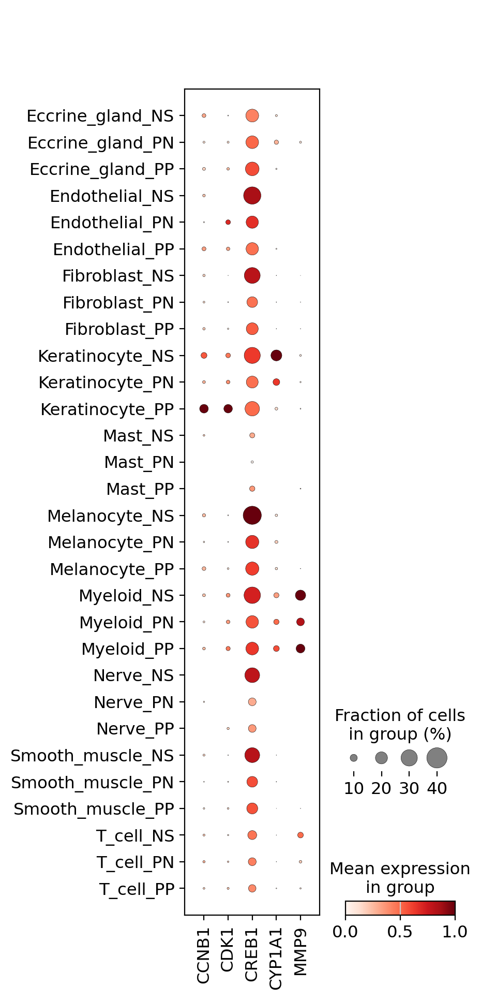

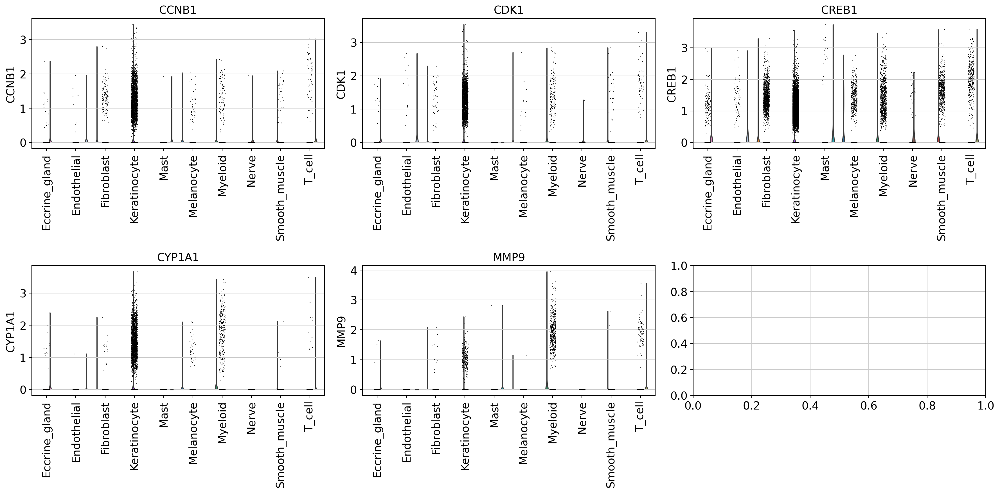

CCNB1      CDK1     CREB1    CYP1A1      MMP9
cell_type     condition                                                  
Eccrine_gland NS         0.051228  0.007788  0.230560  0.031519  0.000000
              PN         0.020842  0.020775  0.266487  0.069021  0.025704
              PP         0.027758  0.038175  0.300379  0.009530  0.000000
Endothelial   NS         0.035985  0.000000  0.423655  0.000000  0.000000
              PN         0.002578  0.107175  0.338664  0.000000  0.000000
              PP         0.054703  0.050814  0.254886  0.008550  0.000000
Fibroblast    NS         0.028350  0.001792  0.401194  0.003364  0.000451
              PN         0.025084  0.009443  0.253515  0.004335  0.002930
              PP         0.032906  0.013431  0.278368  0.002516  0.002533
Keratinocyte  NS         0.089179  0.070244  0.321808  0.249501  0.015851
              PN         0.044547  0.060530  0.257373  0.159449  0.012039
              PP         0.162767  0.154791  0.264324  0.035046  0.006440
Mast          NS         0.030624  0.000000  0.177187  0.000000  0.000000
              PN         0.000000  0.000000  0.042843  0.000000  0.000000
              PP         0.000000  0.000000  0.202764  0.000000  0.019012
Melanocyte    NS         0.040469  0.005901  0.486090  0.025957  0.000000
              PN         0.015680  0.010378  0.334178  0.044794  0.000000
              PP         0.043686  0.016471  0.317180  0.031978  0.003091
Myeloid       NS         0.036790  0.056759  0.362452  0.083914  0.266485
              PN         0.021540  0.054966  0.290983  0.124515  0.219736
              PP         0.041101  0.070713  0.326433  0.143500  0.266247
Nerve         NS         0.000000  0.000000  0.395827  0.000000  0.000000
              PN         0.019856  0.000000  0.175024  0.000000  0.000000
              PP         0.000000  0.028337  0.198957  0.000000  0.000000
Smooth_muscle NS         0.027235  0.004297  0.403124  0.001402  0.000000
              PN         0.009188  0.012507  0.297919  0.004428  0.000000
              PP         0.018407  0.023453  0.292750  0.001067  0.004440
T_cell        NS         0.035119  0.018964  0.249302  0.002820  0.131958
              PN         0.045550  0.028844  0.235623  0.004830  0.053739
              PP         0.030433  0.033902  0.221588  0.010292  0.025338

In [ ]:
TARGET_GENES = ["CCNB1", "CDK1", "CREB1", "CYP1A1", "MMP9"]
genes_present = [g for g in TARGET_GENES if g in adata.var_names]
missing = set(TARGET_GENES) - set(genes_present)
if missing:
    print(f"NOTE: these target genes were not detected in this dataset after QC/filtering: {missing}")

sc.pl.dotplot(adata, genes_present, groupby=["cell_type", "condition"],
              save="_target_genes_dotplot.png", show=True, standard_scale="var")

fig, axes = plt.subplots(2, 3, figsize=(18, 9))
for i, gene in enumerate(genes_present):
    ax = axes.flat[i]
    sc.pl.violin(adata, gene, groupby="cell_type", ax=ax, show=False, rotation=90)
    ax.set_title(gene)
plt.tight_layout()
plt.savefig(f"{FIG_DIR}/target_genes_violin.png", dpi=150)
plt.show()

# Export mean expression per cell type x condition for the manuscript supplementary table
target_expr = sc.get.obs_df(adata, keys=genes_present + ["cell_type", "condition"])
target_summary = target_expr.groupby(["cell_type", "condition"]).mean(numeric_only=True)
target_summary.to_csv(f"{TAB_DIR}/target_genes_by_celltype_condition.csv")
target_summary


## 8. Analysis B — AP-1, CREB1, and interferon signaling by cell type

Addresses reviewer Concerns 5 (network-centrality/hub bias) and 10 (type I vs. III interferon novelty
calibration). We compute an interferon-stimulated-gene (ISG) module score, and separately compare
IFNL1/IFNL4 (type III) vs. the IFNA family (type I) expression by cell type, since these come from
different upstream cellular sources.


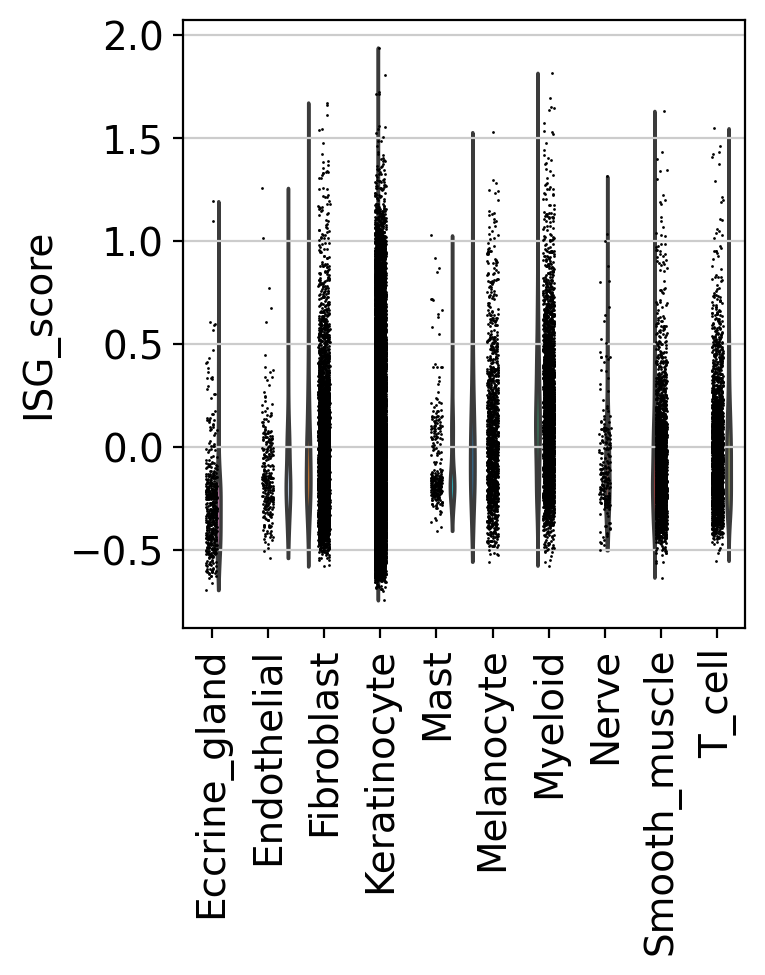

condition         NS     PN     PP
cell_type                         
Eccrine_gland -0.303 -0.339 -0.205
Endothelial   -0.198 -0.161 -0.057
Fibroblast    -0.081 -0.092  0.061
Keratinocyte  -0.292 -0.146  0.237
Mast          -0.155 -0.141  0.014
Melanocyte    -0.078 -0.005  0.301
Myeloid        0.101  0.157  0.200
Nerve         -0.147 -0.052  0.073
Smooth_muscle -0.110 -0.128 -0.000
T_cell        -0.103 -0.071  0.030


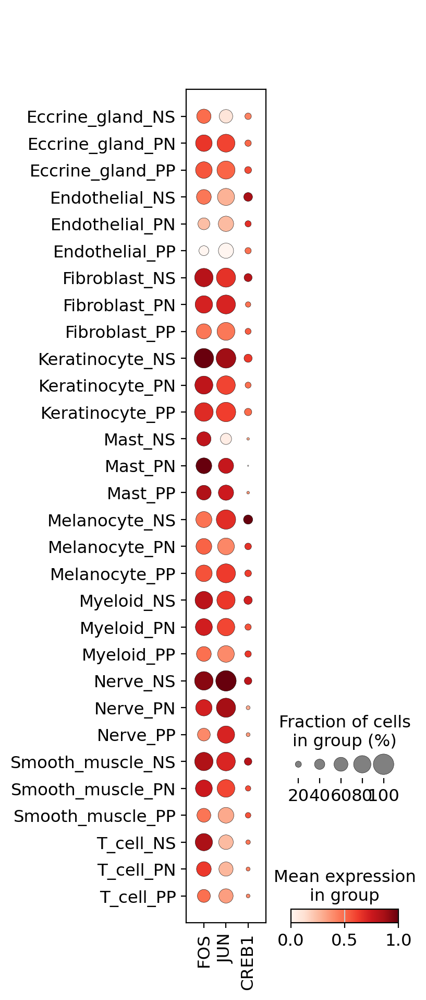


Type I IFN genes detected: [] (of ['IFNA1', 'IFNA2', 'IFNA6', 'IFNA7', 'IFNA10', 'IFNA14', 'IFNA16', 'IFNA21'])
Type III IFN genes detected: ['IFNL1'] (of ['IFNL1', 'IFNL2', 'IFNL3', 'IFNL4'])
NOTE: if most/all of these are absent, that itself is a reportable finding -- it means bulk
microarray/RNA-seq (which pools far more reads) is picking up transcripts below scRNA-seq
detection depth, and any type I/III IFN claims from this dataset should be limited to whichever
of these genes actually survived filtering.


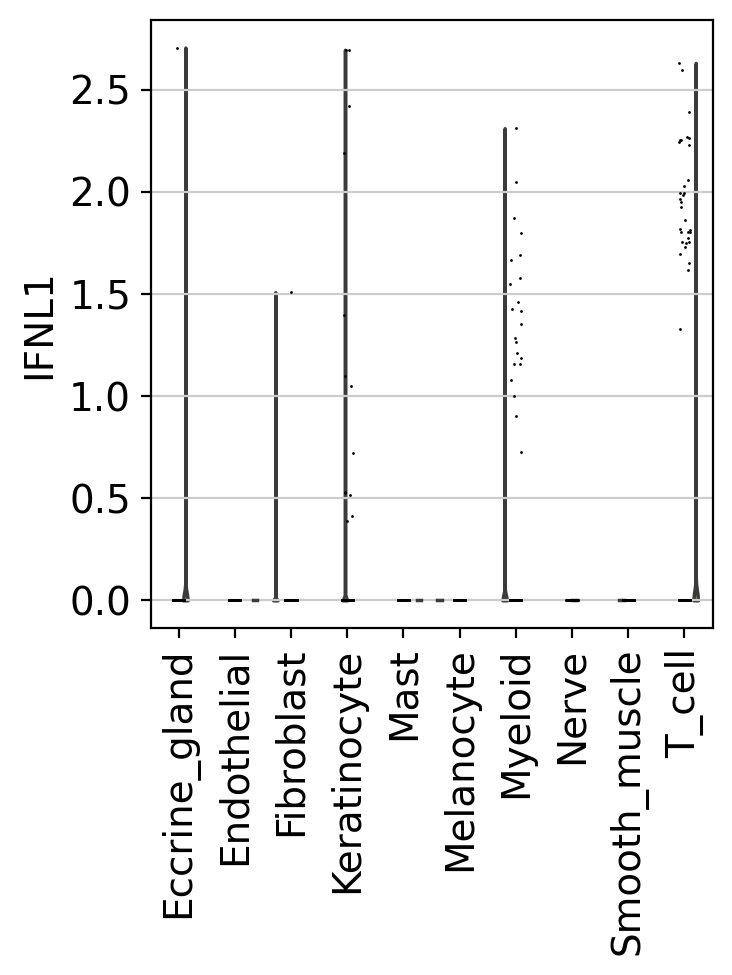

In [ ]:
AP1_CREB1_GENES = ["FOS", "JUN", "CREB1"]
ISG_MODULE = ["STAT1", "IRF1", "IRF3", "IRF7", "ISG15", "MX1", "OAS1", "IFIT1", "IFIT3", "IFI6", "IFI27"]
IFN_TYPE_I = ["IFNA1", "IFNA2", "IFNA6", "IFNA7", "IFNA10", "IFNA14", "IFNA16", "IFNA21"]
IFN_TYPE_III = ["IFNL1", "IFNL2", "IFNL3", "IFNL4"]

isg_present = [g for g in ISG_MODULE if g in adata.var_names]
if isg_present:
    sc.tl.score_genes(adata, isg_present, score_name="ISG_score")
    sc.pl.violin(adata, "ISG_score", groupby="cell_type", rotation=90, save="_ISG_score.png", show=True)
    isg_summary = adata.obs.groupby(["cell_type", "condition"])["ISG_score"].mean().unstack()
    isg_summary.to_csv(f"{TAB_DIR}/ISG_score_by_celltype_condition.csv")
    print(isg_summary.round(3))
else:
    print("No ISG module genes detected in this dataset.")

ap1_present = [g for g in AP1_CREB1_GENES if g in adata.var_names]
if ap1_present:
    sc.pl.dotplot(adata, ap1_present, groupby=["cell_type", "condition"],
                  save="_AP1_CREB1_dotplot.png", show=True, standard_scale="var")

# Type I vs III interferon detection check -- report which are even present, since low-abundance
# cytokine transcripts like IFNA family members often drop out of standard scRNA-seq depth
type_i_present = [g for g in IFN_TYPE_I if g in adata.var_names]
type_iii_present = [g for g in IFN_TYPE_III if g in adata.var_names]
print(f"\nType I IFN genes detected: {type_i_present} (of {IFN_TYPE_I})")
print(f"Type III IFN genes detected: {type_iii_present} (of {IFN_TYPE_III})")
print("NOTE: if most/all of these are absent, that itself is a reportable finding -- it means bulk")
print("microarray/RNA-seq (which pools far more reads) is picking up transcripts below scRNA-seq")
print("detection depth, and any type I/III IFN claims from this dataset should be limited to whichever")
print("of these genes actually survived filtering.")

for g in type_i_present + type_iii_present:
    sc.pl.violin(adata, g, groupby="cell_type", rotation=90, show=True)


## 9. Analysis C — Pseudobulk aggregation and concordance with your GSE14905 DEGs

Aggregates single-cell counts to one pseudobulk profile per donor x condition, runs differential
expression (PP vs NS) with pydeseq2, and checks direction/magnitude concordance against your original
microarray DEG list.

**Upload your DEG table when prompted** — a CSV with columns `gene`, `log2FC`, `padj` (rename your
columns to match, or edit `DEG_COL_MAP` below). Without an upload, this section falls back to a small
demo list built only from the top up/down genes named in your manuscript abstract, which is NOT a
substitute for the real 556-gene comparison.


In [ ]:
from google.colab import files
print("Upload your GSE14905 DEG table (CSV with gene / log2FC / padj columns).")
print("If you don't have one ready, press Cancel/skip in the upload dialog to run in demo mode.")

uploaded = files.upload()

DEG_COL_MAP = {"gene": "gene", "log2FC": "log2FC", "padj": "padj"}  # edit if your column names differ

if uploaded:
    deg_filename = list(uploaded.keys())[0]
    bulk_degs = pd.read_csv(deg_filename)
    bulk_degs = bulk_degs.rename(columns={v: k for k, v in DEG_COL_MAP.items()})
    print(f"Loaded {len(bulk_degs)} DEGs from {deg_filename}")
else:
    print("No file uploaded -- using DEMO fallback list (top named genes from the abstract only).")
    bulk_degs = pd.DataFrame({
        "gene": ["SPRR2C","S100A12","TCN1","IGFL1","GPR15LG","KLK6","CXCL9","LCE3D","TMPRSS11D","S100A7A",
                 "PPP1R1A","STC1","LPL","KRT77","ACVR1C","IL6","MUC7","FOSB","CYP1A1","FOS"],
        "log2FC": [7.549,7.079,6.396,6.332,6.191,5.654,5.643,5.413,5.275,5.223,
                   -3.770,-3.796,-3.814,-3.871,-3.952,-4.328,-4.423,-4.455,-4.622,-4.924],
        "padj": [0.001]*20
    })

bulk_degs = bulk_degs.dropna(subset=["gene", "log2FC"])
bulk_degs.to_csv(f"{TAB_DIR}/bulk_degs_used_for_comparison.csv", index=False)


Upload your GSE14905 DEG table (CSV with gene / log2FC / padj columns).
If you don't have one ready, press Cancel/skip in the upload dialog to run in demo mode.


Saving DEGs.csv to DEGs (1).csv
Loaded 556 DEGs from DEGs (1).csv


In [ ]:
# Build pseudobulk matrix: sum raw counts per donor x condition group
adata.obs["pseudobulk_group"] = adata.obs["condition"].astype(str) + "_" + adata.obs["donor"].astype(str)

groups = adata.obs["pseudobulk_group"].unique()
pb_counts = pd.DataFrame(index=adata.var_names)
pb_meta = []

for g in groups:
    mask = adata.obs["pseudobulk_group"] == g
    counts_sum = np.asarray(adata.layers["counts"][mask.values, :].sum(axis=0)).flatten()
    pb_counts[g] = counts_sum
    pb_meta.append({"group": g, "condition": g.split("_")[0], "n_cells": int(mask.sum())})

pb_meta = pd.DataFrame(pb_meta).set_index("group")
pb_counts = pb_counts.T  # samples x genes, as pydeseq2 expects
pb_counts = pb_counts.loc[:, pb_counts.sum(axis=0) > 0]
pb_counts = pb_counts.round().astype(int)

print(f"Pseudobulk matrix: {pb_counts.shape[0]} pseudo-samples x {pb_counts.shape[1]} genes")
pb_meta["condition"].value_counts()


Pseudobulk matrix: 33 pseudo-samples x 25041 genes


condition
PP    14
PN    11
NS     8
Name: count, dtype: int64

In [ ]:
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

# Compare PP (lesional) vs NS (healthy) -- drop PN for this primary contrast
pb_sub_meta = pb_meta[pb_meta["condition"].isin(["PP", "NS"])].copy()
pb_sub_counts = pb_counts.loc[pb_sub_meta.index]

dds = DeseqDataSet(
    counts=pb_sub_counts,
    metadata=pb_sub_meta,
    design_factors="condition",
    refit_cooks=True,
)
dds.deseq2()

stat_res = DeseqStats(dds, contrast=["condition", "PP", "NS"])
stat_res.summary()
pseudobulk_de = stat_res.results_df.reset_index().rename(columns={"index": "gene"})
pseudobulk_de = pseudobulk_de.rename(columns={"log2FoldChange": "log2FC_pseudobulk", "padj": "padj_pseudobulk"})
pseudobulk_de.to_csv(f"{TAB_DIR}/pseudobulk_DE_PPvsNS.csv", index=False)
pseudobulk_de.sort_values("padj_pseudobulk").head(20)


Fitting size factors...
... done in 0.04 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 36.56 seconds.

Fitting dispersion trend curve...
... done in 1.19 seconds.

Fitting MAP dispersions...
... done in 47.48 seconds.

Fitting LFCs...
... done in 27.40 seconds.

Calculating cook's distance...
... done in 0.12 seconds.

Replacing 41 outlier genes.

Fitting dispersions...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting LFCs...
... done in 0.17 seconds.

Running Wald tests...
... done in 6.88 seconds.



Log2 fold change & Wald test p-value: condition PP vs NS
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
A1BG      136.175880       -0.675786  0.317474 -2.128635  0.033284  0.093130
A1BG-AS1   16.853168       -0.249337  0.419570 -0.594268  0.552333  0.693748
A2M       242.704517        0.284221  0.604381  0.470269  0.638163  0.762816
A2M-AS1     6.546638        0.001628  0.433195  0.003758  0.997001  0.997971
A2ML1     229.157385        0.957384  0.459425  2.083874  0.037172  0.101089
...              ...             ...       ...       ...       ...       ...
ZYG11A      1.059250        0.232065  0.750912  0.309044  0.757288  0.848826
ZYG11B    109.111723       -0.609987  0.179991 -3.388991  0.000702  0.004789
ZYX       237.474642        0.338137  0.233828  1.446089  0.148152  0.278344
ZZEF1     105.379985       -0.542998  0.196652 -2.761216  0.005759  0.024458
ZZZ3      144.728153       -0.471789  0.149732 -3.150888  0.001628  0.009249

[25041 rows x 6 co

,gene,baseMean,log2FC_pseudobulk,lfcSE,stat,pvalue,padj_pseudobulk
19667,S100A9,2646.081830,6.490035,0.320817,20.229695,5.363326e-91,1.048959e-86
20054,SERPINB4,661.045342,8.295224,0.495590,16.738087,6.917547e-63,6.764669e-59
21255,SPRR2A,685.012786,8.712918,0.540674,16.114907,2.004651e-58,1.306899e-54
19666,S100A8,2577.888297,5.895790,0.388142,15.189769,4.133758e-52,2.021201e-48
10064,GJB2,753.446853,3.997823,0.279550,14.300941,2.158697e-46,8.443960e-43
19664,S100A7,2077.827353,6.242420,0.460948,13.542582,8.765265e-42,2.857184e-38
12347,KRT6A,1387.921240,5.012986,0.401497,12.485741,8.930749e-36,2.495251e-32
544,AKR1B10,285.028763,5.125883,0.425715,12.040642,2.172591e-33,5.311442e-30
19665,S100A7A,225.857626,7.751553,0.669712,11.574459,5.552031e-31,1.100564e-27
12412,KYNU,189.823896,4.972082,0.429616,11.573306,5.627183e-31,1.100564e-27


Genes overlapping between bulk DEG list and pseudobulk results: 538 / 556
Direction concordance: 85.7%
Spearman correlation of log2FC (bulk vs pseudobulk): 0.722


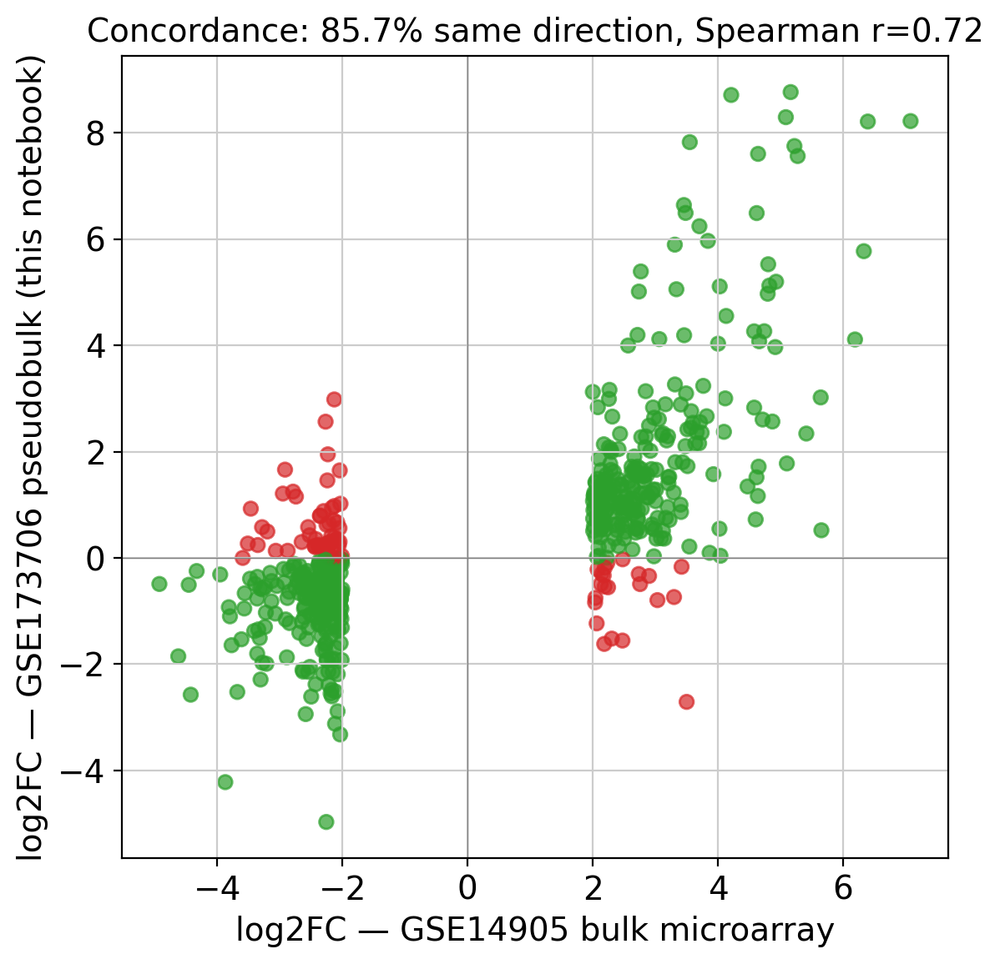

In [ ]:
# Concordance check against the uploaded/bulk GSE14905 DEG list
merged = bulk_degs.merge(pseudobulk_de, on="gene", how="inner")
print(f"Genes overlapping between bulk DEG list and pseudobulk results: {len(merged)} / {len(bulk_degs)}")

if len(merged) > 0:
    merged["same_direction"] = np.sign(merged["log2FC"]) == np.sign(merged["log2FC_pseudobulk"])
    concordance_rate = merged["same_direction"].mean()
    corr = merged["log2FC"].corr(merged["log2FC_pseudobulk"], method="spearman")

    print(f"Direction concordance: {concordance_rate:.1%}")
    print(f"Spearman correlation of log2FC (bulk vs pseudobulk): {corr:.3f}")

    fig, ax = plt.subplots(figsize=(6, 6))
    colors = merged["same_direction"].map({True: "tab:green", False: "tab:red"})
    ax.scatter(merged["log2FC"], merged["log2FC_pseudobulk"], c=colors, alpha=0.7)
    ax.axhline(0, color="grey", lw=0.5); ax.axvline(0, color="grey", lw=0.5)
    ax.set_xlabel("log2FC — GSE14905 bulk microarray")
    ax.set_ylabel("log2FC — GSE173706 pseudobulk (this notebook)")
    ax.set_title(f"Concordance: {concordance_rate:.1%} same direction, Spearman r={corr:.2f}")
    plt.tight_layout()
    plt.savefig(f"{FIG_DIR}/bulk_vs_pseudobulk_concordance.png", dpi=150)
    plt.show()

    merged.to_csv(f"{TAB_DIR}/bulk_vs_pseudobulk_concordance.csv", index=False)
else:
    print("No overlapping genes -- check gene symbol formatting between the two sources.")


## 10. Analysis D — Cell-type deconvolution of GSE14905 bulk samples

Builds a signature matrix (mean expression per cell type, top marker genes) from this scRNA-seq data,
then applies non-negative least squares (NNLS) — the same core regression step CIBERSORT-family methods
use — to estimate cell-type proportions in each GSE14905 bulk sample. Addresses reviewer Concern 11.

This downloads the GSE14905 series matrix directly; if the automated GPL570 probe-to-gene mapping step
fails (annotation table formats vary), you'll be prompted to supply your own probe-to-gene mapping file,
since your manuscript already did this mapping via g:Profiler.


In [ ]:
import GEOparse

print("Downloading GSE14905 (this may take a few minutes)...")
gse_bulk = GEOparse.get_GEO(geo="GSE14905", destdir=f"{RAW_DIR}/GSE14905")

bulk_expr = gse_bulk.pivot_samples("VALUE")
print(f"Bulk expression matrix: {bulk_expr.shape[0]} probes x {bulk_expr.shape[1]} samples")

bulk_sample_meta = pd.DataFrame({
    "title": {gsm: s.metadata["title"][0] for gsm, s in gse_bulk.gsms.items()},
})
def classify_condition(title):
    """GSE14905 titles use 'Normal Skin', 'Lesion Skin', and 'Uninvolved Skin' --
    not 'lesional'/'non-lesional' -- so match against the actual wording rather than assuming."""
    t = str(title).lower()
    if "uninvolved" in t:
        return "Uninvolved Skin"
    elif "lesion" in t:
        return "lesional"
    elif "normal" in t or "healthy" in t or "control" in t:
        return "healthy"
    return "unknown"

bulk_sample_meta["condition"] = bulk_sample_meta["title"].apply(classify_condition)
n_unknown = (bulk_sample_meta["condition"] == "unknown").sum()
if n_unknown > 0:
    print(f"WARNING: {n_unknown} sample(s) unclassified -- check title wording:")
    print(bulk_sample_meta.loc[bulk_sample_meta["condition"] == "unknown", "title"])
bulk_sample_meta.to_csv(f"{TAB_DIR}/GSE14905_sample_meta_raw.csv")
bulk_sample_meta.head(10)


08-Sep-2026 13:09:15 INFO GEOparse - Downloading ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE14nnn/GSE14905/soft/GSE14905_family.soft.gz to /content/psoriasis_sc/raw/GSE14905/GSE14905_family.soft.gz
INFO:GEOparse:Downloading ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE14nnn/GSE14905/soft/GSE14905_family.soft.gz to /content/psoriasis_sc/raw/GSE14905/GSE14905_family.soft.gz


100%|██████████| 47.9M/47.9M [00:01<00:00, 25.7MB/s]
08-Sep-2026 13:09:17 DEBUG downloader - Size validation passed
DEBUG:GEOparse:Size validation passed
08-Sep-2026 13:09:17 DEBUG downloader - Moving /tmp/tmp4dsxi4b5 to /content/psoriasis_sc/raw/GSE14905/GSE14905_family.soft.gz
DEBUG:GEOparse:Moving /tmp/tmp4dsxi4b5 to /content/psoriasis_sc/raw/GSE14905/GSE14905_family.soft.gz
08-Sep-2026 13:09:18 DEBUG downloader - Successfully downloaded ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE14nnn/GSE14905/soft/GSE14905_family.soft.gz
DEBUG:GEOparse:Successfully downloaded ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE14nnn/GSE14905/soft/GSE14905_family.soft.gz
08-Sep-2026 13:09:18 INFO GEOparse - Parsing /content/psoriasis_sc/raw/GSE14905/GSE14905_family.soft.gz: 
INFO:GEOparse:Parsing /content/psoriasis_sc/raw/GSE14905/GSE14905_family.soft.gz: 
08-Sep-2026 13:09:18 DEBUG GEOparse - DATABASE: GeoMiame
DEBUG:GEOparse:DATABASE: GeoMiame
08-Sep-2026 13:09:18 DEBUG GEOparse - SERIES: GSE14905
DEBUG:GEOpa

Bulk expression matrix: 54675 probes x 82 samples


,title,condition
GSM372286,"Normal Skin, Normal-1",healthy
GSM372287,"Normal Skin, Normal-2",healthy
GSM372288,"Normal Skin, Normal-3",healthy
GSM372289,"Normal Skin, Normal-4",healthy
GSM372290,"Normal Skin, Normal-5",healthy
GSM372291,"Normal Skin, Normal-6",healthy
GSM372292,"Normal Skin, Normal-7",healthy
GSM372293,"Normal Skin, Normal-8",healthy
GSM372294,"Normal Skin, Normal-9",healthy
GSM372295,"Normal Skin, Normal-10",healthy


In [ ]:
# Probe -> gene symbol mapping via the GPL570 platform annotation table
gpl = list(gse_bulk.gpls.values())[0]
gpl_table = gpl.table
print("Platform annotation columns:", list(gpl_table.columns))

gene_col_candidates = [c for c in gpl_table.columns if "gene symbol" in c.lower() or c.lower() == "symbol"]
if gene_col_candidates:
    gene_col = gene_col_candidates[0]
    probe_to_gene = gpl_table.set_index("ID")[gene_col]
    bulk_expr_gene = bulk_expr.copy()
    bulk_expr_gene["gene"] = bulk_expr_gene.index.map(probe_to_gene)
    bulk_expr_gene = bulk_expr_gene.dropna(subset=["gene"])
    bulk_expr_gene = bulk_expr_gene[bulk_expr_gene["gene"].str.strip() != ""]
    # collapse multiple probes per gene by mean, matching the manuscript's stated approach
    bulk_expr_gene = bulk_expr_gene.groupby("gene").mean(numeric_only=True)
    print(f"Mapped to {bulk_expr_gene.shape[0]} unique genes.")
else:
    print("Could not auto-detect a gene symbol column in the GPL570 annotation table.")
    print("Available columns were:", list(gpl_table.columns))
    print("Please supply your own probe-to-gene mapping (matching what you used with g:Profiler)")
    print("as a two-column CSV (probe_id, gene) and re-run this cell with it loaded manually.")
    bulk_expr_gene = None


Platform annotation columns: ['ID', 'GB_ACC', 'SPOT_ID', 'Species Scientific Name', 'Annotation Date', 'Sequence Type', 'Sequence Source', 'Target Description', 'Representative Public ID', 'Gene Title', 'Gene Symbol', 'ENTREZ_GENE_ID', 'RefSeq Transcript ID', 'Gene Ontology Biological Process', 'Gene Ontology Cellular Component', 'Gene Ontology Molecular Function']
Mapped to 23520 unique genes.


Signature matrix: 408 genes x 10 cell types
Genes usable for deconvolution (overlap of signature and bulk): 377
                 Eccrine_gland  Endothelial  Fibroblast  Keratinocyte  Mast  \
condition                                                                     
Uninvolved Skin          0.002        0.009       0.415         0.305   0.0   
healthy                  0.000        0.028       0.433         0.289   0.0   
lesional                 0.000        0.003       0.417         0.343   0.0   

                 Melanocyte  Myeloid  Nerve  Smooth_muscle  T_cell  
condition                                                           
Uninvolved Skin       0.231    0.001  0.019          0.017     0.0  
healthy               0.206    0.005  0.024          0.015     0.0  
lesional              0.225    0.009  0.001          0.001     0.0  


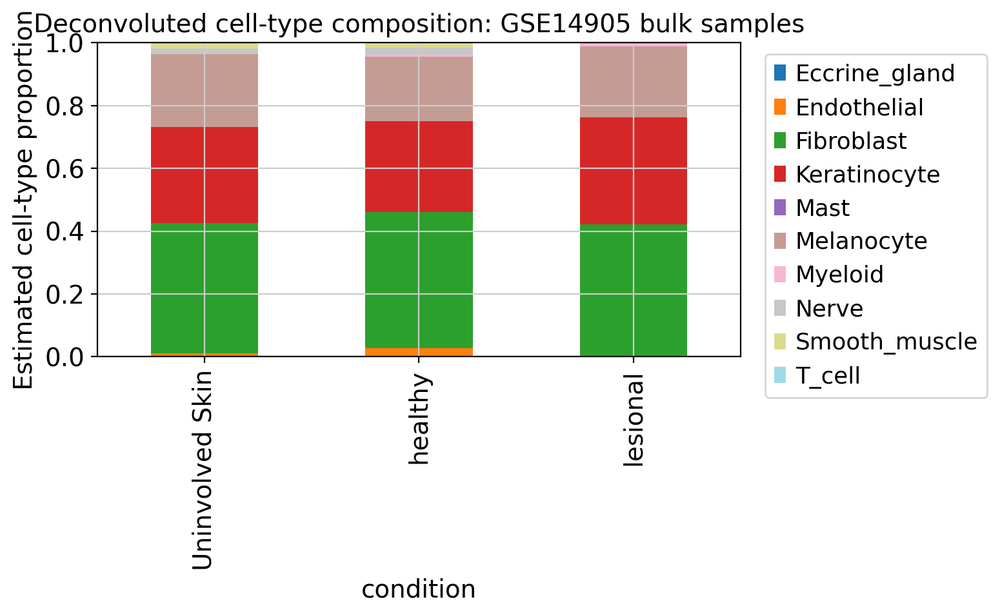

In [ ]:
if bulk_expr_gene is not None:
    # --- Build signature matrix from scRNA-seq: mean expression per cell type, top marker genes ---
    sc.tl.rank_genes_groups(adata, groupby="cell_type", method="wilcoxon", n_genes=100)
    sig_genes = set()
    for ct in adata.obs["cell_type"].cat.categories:
        sig_genes.update(adata.uns["rank_genes_groups"]["names"][ct][:50])
    sig_genes = sorted(sig_genes)

    sig_matrix = pd.DataFrame(index=sig_genes, columns=adata.obs["cell_type"].cat.categories, dtype=float)
    for ct in sig_matrix.columns:
        mask = (adata.obs["cell_type"] == ct).values
        mean_expr = np.asarray(adata[mask, sig_genes].layers["counts"].mean(axis=0)).flatten()
        sig_matrix[ct] = mean_expr

    sig_matrix.to_csv(f"{TAB_DIR}/celltype_signature_matrix.csv")
    print(f"Signature matrix: {sig_matrix.shape[0]} genes x {sig_matrix.shape[1]} cell types")

    # --- NNLS deconvolution of each bulk sample against the signature matrix ---
    from scipy.optimize import nnls

    common_genes = sig_matrix.index.intersection(bulk_expr_gene.index)
    print(f"Genes usable for deconvolution (overlap of signature and bulk): {len(common_genes)}")

    A = sig_matrix.loc[common_genes].values
    A = A / (A.sum(axis=0, keepdims=True) + 1e-9)  # normalize signature columns

    proportions = {}
    for sample in bulk_expr_gene.columns:
        b = bulk_expr_gene.loc[common_genes, sample].values
        b = np.clip(b, 0, None)
        coef, _ = nnls(A, b)
        coef = coef / (coef.sum() + 1e-9)
        proportions[sample] = coef

    prop_df = pd.DataFrame(proportions, index=sig_matrix.columns).T
    prop_df = prop_df.join(bulk_sample_meta["condition"])
    prop_df.to_csv(f"{TAB_DIR}/GSE14905_deconvolution_proportions.csv")

    prop_summary = prop_df.groupby("condition").mean(numeric_only=True)
    print(prop_summary.round(3))

    prop_summary.plot(kind="bar", stacked=True, figsize=(8, 5), colormap="tab20")
    plt.ylabel("Estimated cell-type proportion")
    plt.title("Deconvoluted cell-type composition: GSE14905 bulk samples")
    plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.savefig(f"{FIG_DIR}/deconvolution_composition.png", dpi=150)
    plt.show()
else:
    print("Skipping deconvolution -- gene mapping was not available. See message above.")


## 11. Export everything for download

In [ ]:
import shutil

zip_path = "/content/psoriasis_sc_outputs"
shutil.make_archive(zip_path, "zip", OUT_DIR)
print(f"All figures and tables zipped to: {zip_path}.zip")

from google.colab import files
files.download(f"{zip_path}.zip")


All figures and tables zipped to: /content/psoriasis_sc_outputs.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Notes on interpreting the outputs

- **Section 7 (target genes):** if a gene shows a consistent direction across most cell types, that
  supports the bulk-level finding being a genuine within-cell-type change rather than a composition
  artifact. If it's concentrated in one cell type only, that's worth stating explicitly in the manuscript
  rather than leaving the attribution vague.
- **Section 8 (ISG/AP-1/CREB1):** pay attention to the printed detection-rate note for IFNA vs IFNL genes —
  if most IFNA-family members weren't detected, that's a real and reportable limitation of using scRNA-seq
  depth to confirm bulk-level interferon findings, not a failure of the notebook.
- **Section 9 (pseudobulk concordance):** a low overlap count usually means a gene symbol formatting
  mismatch (e.g. trailing whitespace, case sensitivity) between your uploaded DEG list and this dataset's
  gene names — check that before concluding the concordance itself is poor.
- **Section 10 (deconvolution):** this is a simplified NNLS approach, not CIBERSORTx — defensible as a
  preliminary composition estimate, but should be described as such in the manuscript, not as a validated
  clinical-grade deconvolution.


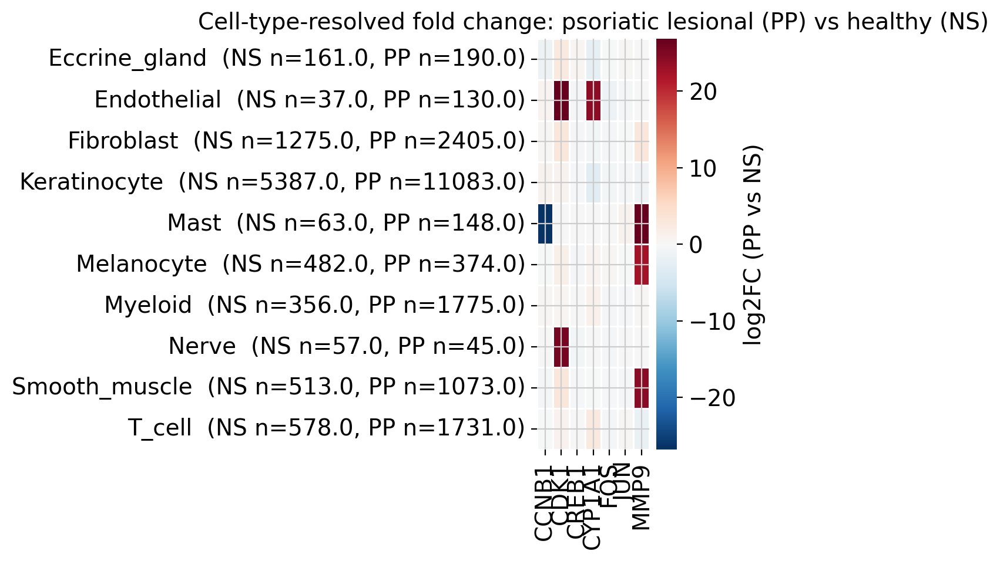


Cells backing each row (blank rows above had <10 cells in NS or PP):
                 n_NS     n_PP
Eccrine_gland   161.0    190.0
Endothelial      37.0    130.0
Fibroblast     1275.0   2405.0
Keratinocyte   5387.0  11083.0
Mast             63.0    148.0
Melanocyte      482.0    374.0
Myeloid         356.0   1775.0
Nerve            57.0     45.0
Smooth_muscle   513.0   1073.0
T_cell          578.0   1731.0


In [ ]:
## Figure 1 — Cell-type-resolved fold change (PP vs NS)
# Combines the 6 phytochemical target genes with the AP-1/CREB1 regulators (CREB1 overlaps
# between the two lists, so this is 8 unique genes, not 9).

TARGET_GENES = ["CCNB1", "CDK1", "CREB1", "CYP1A1", "MMP9"]
AP1_CREB1_GENES = ["FOS", "JUN", "CREB1"]
ALL_GENES = sorted(set(TARGET_GENES) | set(AP1_CREB1_GENES))

genes_present = [g for g in ALL_GENES if g in adata.var_names]
missing = set(ALL_GENES) - set(genes_present)
if missing:
    print(f"NOTE: not detected in this dataset: {missing}")

MIN_CELLS_PER_GROUP = 10  # below this, a cell_type x condition group is treated as too sparse to trust

cell_types = adata.obs["cell_type"].cat.categories.tolist()

# Reverse log1p back to a linear (CP10K) scale before averaging + computing fold change --
# averaging log-values and exponentiating afterward is NOT equivalent to averaging on the
# linear scale, and fold-change interpretation requires the linear scale.
expr_linear = adata[:, genes_present].X
if sp.issparse(expr_linear):
    expr_linear = np.asarray(expr_linear.todense())
expr_linear = np.expm1(expr_linear)

expr_df = pd.DataFrame(expr_linear, columns=genes_present, index=adata.obs_names)
expr_df["cell_type"] = adata.obs["cell_type"].values
expr_df["condition"] = adata.obs["condition"].values

group_means = expr_df.groupby(["cell_type", "condition"])[genes_present].mean()
group_counts = expr_df.groupby(["cell_type", "condition"]).size()

log2fc = pd.DataFrame(index=cell_types, columns=genes_present, dtype=float)
n_cells_pp = pd.Series(index=cell_types, dtype=int)
n_cells_ns = pd.Series(index=cell_types, dtype=int)
PSEUDOCOUNT = 1e-9

for ct in cell_types:
    n_pp = group_counts.get((ct, "PP"), 0)
    n_ns = group_counts.get((ct, "NS"), 0)
    n_cells_pp[ct] = n_pp
    n_cells_ns[ct] = n_ns
    if n_pp >= MIN_CELLS_PER_GROUP and n_ns >= MIN_CELLS_PER_GROUP:
        mean_pp = group_means.loc[(ct, "PP")]
        mean_ns = group_means.loc[(ct, "NS")]
        log2fc.loc[ct] = np.log2((mean_pp + PSEUDOCOUNT) / (mean_ns + PSEUDOCOUNT))
    else:
        log2fc.loc[ct] = np.nan  # too few cells in one or both conditions -- leave blank, don't guess

log2fc = log2fc.astype(float)
log2fc.to_csv(f"{TAB_DIR}/celltype_log2FC_PPvsNS.csv")

row_labels = [f"{ct}  (NS n={n_cells_ns[ct]}, PP n={n_cells_pp[ct]})" for ct in cell_types]

fig, ax = plt.subplots(figsize=(max(6, len(genes_present) * 0.9), max(4, len(cell_types) * 0.5)))
vmax = np.nanmax(np.abs(log2fc.values)) if np.isfinite(log2fc.values).any() else 1
sns.heatmap(
    log2fc, cmap="RdBu_r", center=0, vmin=-vmax, vmax=vmax,
    yticklabels=row_labels, xticklabels=genes_present,
    cbar_kws={"label": "log2FC (PP vs NS)"},
    linewidths=0.5, linecolor="white",
    mask=log2fc.isna(), ax=ax
)
ax.set_title("Cell-type-resolved fold change: psoriatic lesional (PP) vs healthy (NS)")
plt.tight_layout()
plt.savefig(f"{FIG_DIR}/celltype_log2FC_heatmap.png", dpi=150)
plt.show()

print(f"\nCells backing each row (blank rows above had <{MIN_CELLS_PER_GROUP} cells in NS or PP):")
print(pd.DataFrame({"n_NS": n_cells_ns, "n_PP": n_cells_pp}))

In [ ]:
## Figure 2 — Publication-ready expression dotplot, with corrected header spacing
## All header tiers (suptitle, condition title, module label, module bracket) are placed
## on the SAME absolute figure-fraction scale (fig.transFigure), so vertical spacing is
## guaranteed identical between the Healthy and Lesional panels -- not dependent on each
## axes' own bounding box, which is what caused the drift before.

from collections import OrderedDict
import matplotlib.transforms as mtransforms

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "Helvetica", "DejaVu Sans"],
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "axes.linewidth": 0.8,
    "svg.fonttype": "none",
})

CONDITIONS_ORDER = ["NS", "PP"]
CONDITION_LABELS = {"NS": "Healthy", "PP": "Lesional"}

GENE_MODULES = OrderedDict([
    ("Proliferation", ["CCNB1", "CDK1", "MKI67"]),
    ("AP-1",          ["FOS", "JUN"]),
    ("Interferon",    ["STAT1", "IRF1", "CXCL10"]),
    ("Inflammation",  ["MMP9", "CXCL8", "IL6"]),
    ("Regulator",     ["CREB1"]),
    ("Detox",         ["CYP1A1"]),
    ("Markers",       ["S100A7", "KRT16", "LCN2", "DEFB4A"]),
])

GENE_ALIASES = {
    "CXCL8":  ["CXCL8", "IL8"],
    "S100A7": ["S100A7", "S100A7A"],
    "DEFB4A": ["DEFB4A", "DEFB4", "DEFB4B"],
    "KRT16":  ["KRT16", "KRT16A"],
    "CXCL10": ["CXCL10"],
}
_var_names = set(adata.var_names)
def _resolve(sym):
    for cand in GENE_ALIASES.get(sym, [sym]):
        if cand in _var_names:
            return cand
    return None

# --- Assign gene x-positions WITH extra padding between modules, so narrow (single-gene)
#     module labels get breathing room and don't merge into their neighbours. ---
GENE_GAP = 1.0     # spacing between genes within the same module
MODULE_GAP = 0.9   # EXTRA spacing inserted between different modules

genes_present, gene_xpos, module_spans, missing = [], [], [], []
cur_x = 0.0
for mi, (_mod, _syms) in enumerate(GENE_MODULES.items()):
    resolved = [g for g in (_resolve(s) for s in _syms) if g is not None]
    missing.extend(s for s in _syms if _resolve(s) is None)
    if not resolved:
        continue
    if mi > 0 and genes_present:
        cur_x += MODULE_GAP  # gap before this module (skipped for the very first module)
    start_x = cur_x
    for g in resolved:
        genes_present.append(g)
        gene_xpos.append(cur_x)
        cur_x += GENE_GAP
    end_x = cur_x - GENE_GAP
    module_spans.append((_mod, start_x, end_x))

if missing:
    print("Undetected in this dataset (dropped from plot):", ", ".join(missing))
print("Genes plotted:", ", ".join(genes_present))

gene_x_of = dict(zip(genes_present, gene_xpos))
x_min, x_max = min(gene_xpos) - 0.6, max(gene_xpos) + 0.6

# --- Fraction of cells expressing (dot size) ---
counts_genes = adata[:, genes_present].layers["counts"]
if sp.issparse(counts_genes):
    counts_genes = np.asarray(counts_genes.todense())
expressed_df = pd.DataFrame((counts_genes > 0).astype(float), columns=genes_present, index=adata.obs_names)
expressed_df["cell_type"] = adata.obs["cell_type"].values
expressed_df["condition"] = adata.obs["condition"].values
pct_expressing = expressed_df.groupby(["cell_type", "condition"])[genes_present].mean() * 100

# --- Mean log-normalized expression (annotated) ---
X_genes = adata[:, genes_present].X
if sp.issparse(X_genes):
    X_genes = np.asarray(X_genes.todense())
expr_log_df = pd.DataFrame(X_genes, columns=genes_present, index=adata.obs_names)
expr_log_df["cell_type"] = adata.obs["cell_type"].values
expr_log_df["condition"] = adata.obs["condition"].values
mean_expr_raw = expr_log_df.groupby(["cell_type", "condition"])[genes_present].mean()

_keep = mean_expr_raw.index.get_level_values("condition").isin(CONDITIONS_ORDER)
mean_expr_raw = mean_expr_raw[_keep]
pct_expressing = pct_expressing[pct_expressing.index.get_level_values("condition").isin(CONDITIONS_ORDER)]

mean_expr_scaled = (mean_expr_raw - mean_expr_raw.min()) / (mean_expr_raw.max() - mean_expr_raw.min() + 1e-9)

cell_types = adata.obs["cell_type"].cat.categories.tolist()
n_ct = len(cell_types)
plot_width_units = x_max - x_min

# --- Figure geometry: reserve a FIXED top margin (in real figure-fraction) for headers ---
FIG_WIDTH = 0.42 * plot_width_units * 2 + 3.2
FIG_HEIGHT = 0.52 * n_ct + 3.4
fig = plt.figure(figsize=(FIG_WIDTH, FIG_HEIGHT), dpi=300)

TOP_MARGIN = 0.78   # axes data area occupies the bottom 78% of the figure height
gs = fig.add_gridspec(1, 3, width_ratios=[5, 5, 1.8], wspace=0.10,
                       top=TOP_MARGIN, bottom=0.08, left=0.055, right=0.97)
axes = [fig.add_subplot(gs[0, i]) for i in range(2)]
legend_ax = fig.add_subplot(gs[0, 2]); legend_ax.axis("off")
for ax in axes[1:]:
    ax.sharey(axes[0])

# --- Fixed absolute header y-positions (figure fraction, identical for both panels) ---
Y_BRACKET  = TOP_MARGIN + 0.035   # module bracket line
Y_MODLAB   = TOP_MARGIN + 0.075   # module name text
Y_CONDTTL  = TOP_MARGIN + 0.150   # "Healthy" / "Lesional"
Y_SUPTITLE = TOP_MARGIN + 0.220   # overall figure title

for ax, cond in zip(axes, CONDITIONS_ORDER):
    for yi, ct in enumerate(cell_types):
        for gene in genes_present:
            if (ct, cond) not in mean_expr_scaled.index:
                continue
            xi = gene_x_of[gene]
            color_val = mean_expr_scaled.loc[(ct, cond), gene]
            size_val  = pct_expressing.loc[(ct, cond), gene]
            raw_val   = mean_expr_raw.loc[(ct, cond), gene]
            ax.scatter(xi, yi, s=max(size_val * 4, 30), c=[color_val], cmap="Reds",
                       vmin=0, vmax=1, edgecolors="0.35", linewidths=0.3, zorder=2)
            ax.text(xi, yi, f"{raw_val:.2f}", ha="center", va="center",
                    fontsize=5.5, color="white" if color_val > 0.55 else "black", zorder=3)

    ax.set_xticks(gene_xpos)
    ax.set_xticklabels(genes_present, rotation=90, fontsize=8.5, style="italic")
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(-0.5, n_ct - 0.5)
    ax.tick_params(axis="both", length=2.5, width=0.7)
    ax.grid(axis="both", linestyle=":", linewidth=0.4, color="grey", alpha=0.35, zorder=0)
    ax.set_axisbelow(True)
    for _sp in ax.spines.values():
        _sp.set_linewidth(0.8)

    # x in this axes' data coords, y in ABSOLUTE figure fraction -- guarantees the same
    # height on both panels regardless of any per-axes bounding-box differences.
    tb = mtransforms.blended_transform_factory(ax.transData, fig.transFigure)

    for (_mod, _s, _e) in module_spans[1:]:
        sep_x = _s - MODULE_GAP / 2
        ax.axvline(sep_x, color="grey", lw=0.5, ls="-", alpha=0.35, zorder=1)

    for (_mod, _s, _e) in module_spans:
        ax.plot([_s - 0.35, _e + 0.35], [Y_BRACKET, Y_BRACKET], transform=tb,
                color="0.25", lw=1.0, clip_on=False, zorder=4)
        ax.text((_s + _e) / 2.0, Y_MODLAB, _mod, transform=tb,
                ha="center", va="bottom", fontsize=7.5, color="0.15",
                clip_on=False, zorder=5)

    # Condition title: x-centered on THIS axes, y fixed in figure fraction
    pos = ax.get_position()
    x_center_fig = (pos.x0 + pos.x1) / 2.0
    fig.text(x_center_fig, Y_CONDTTL, CONDITION_LABELS[cond],
              ha="center", va="bottom", fontsize=13, fontweight="bold")

axes[0].set_yticks(range(n_ct))
axes[0].set_yticklabels(cell_types, fontsize=10)
for ax in axes[1:]:
    plt.setp(ax.get_yticklabels(), visible=False)

# --- Overall title: centered over the two data panels only (not the legend column) ---
x0 = axes[0].get_position().x0
x1 = axes[1].get_position().x1
fig.text((x0 + x1) / 2.0, Y_SUPTITLE,
          "Target-gene, regulator, and marker expression by cell type and condition",
          ha="center", va="bottom", fontsize=14.5, fontweight="bold")

# --- Colorbar ---
cbar_ax = legend_ax.inset_axes([0.12, 0.66, 0.28, 0.26])
sm = plt.cm.ScalarMappable(cmap="Reds", norm=plt.Normalize(0, 1)); sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Relative color\n(per gene, 0\u20131)", fontsize=8.5)
cbar.ax.tick_params(labelsize=7.5, length=2.5, width=0.7)
cbar.outline.set_linewidth(0.7)

# --- Size legend ---
size_handles = [
    plt.scatter([], [], s=max(pct * 4, 30), c="0.6", edgecolors="0.35", linewidths=0.3, label=f"{pct}%")
    for pct in [25, 50, 75, 100]
]
legend_ax.legend(handles=size_handles, title="% cells\nexpressing",
                 loc="center left", bbox_to_anchor=(0.02, 0.26),
                 fontsize=8.5, title_fontsize=9, frameon=False,
                 labelspacing=1.5, handletextpad=1.2)

fig.savefig(f"{FIG_DIR}/target_genes_dotplot_by_condition.pdf", bbox_inches="tight")
fig.savefig(f"{FIG_DIR}/target_genes_dotplot_by_condition.svg", bbox_inches="tight")
fig.savefig(f"{FIG_DIR}/target_genes_dotplot_by_condition.png", dpi=300, bbox_inches="tight")
print("Saved PDF / SVG / PNG.")
plt.show()

caption = (
    "Figure 2. Target-gene, regulator, and marker expression by cell type and condition in "
    "psoriatic skin (scRNA-seq dataset GSE173706; Ma et al., Nat Commun 2023). To match the "
    "lesional-versus-healthy design of the bulk analysis, only Healthy (normal skin from "
    "unaffected donors) and Lesional (psoriatic plaque skin) groups are shown; genes are grouped "
    "into functional modules (labelled above each panel): proliferation (CCNB1, CDK1, MKI67), "
    "AP-1 (FOS, JUN), interferon (STAT1, IRF1, CXCL10), inflammation/matrix (MMP9, CXCL8, "
    "IL6), the upstream regulator CREB1, the detoxification target CYP1A1, and canonical psoriasis "
    "markers (S100A7, KRT16, LCN2, DEFB4). Dot size indicates the percentage of cells in each "
    "cell type/condition group expressing the gene (>0 counts); numbers within each dot report the "
    "mean log-normalized expression (log1p, CP10k) for that group. Dot color reflects expression "
    "scaled to a 0-1 range independently for each gene (min-max across the displayed groups) and "
    "is NOT comparable across genes; absolute magnitude should be read from the annotated values. "
    "Interferon ligands (IFNL1/IFNL4, IFNA family) fall below reliable single-cell detection and "
    "are represented by their downstream response genes rather than the ligands themselves."
)
print("\n--- CAPTION ---\n", caption)
with open(f"{TAB_DIR}/Figure2_caption.txt", "w") as f:
    f.write(caption)

Genes plotted: CCNB1, CDK1, MKI67, FOS, JUN, STAT1, IRF1, CXCL10, MMP9, CXCL8, IL6, CREB1, CYP1A1, S100A7, KRT16, LCN2, DEFB4A
Saved PDF / SVG / PNG.



--- CAPTION ---
 Figure 2. Target-gene, regulator, and marker expression by cell type and condition in psoriatic skin (scRNA-seq dataset GSE173706; Ma et al., Nat Commun 2023). To match the lesional-versus-healthy design of the bulk analysis, only Healthy (normal skin from unaffected donors) and Lesional (psoriatic plaque skin) groups are shown; genes are grouped into functional modules (labelled above each panel): proliferation (CCNB1, CDK1, MKI67), AP-1 (FOS, JUN), interferon (STAT1, IRF1, CXCL10), inflammation/matrix (MMP9, CXCL8, IL6), the upstream regulator CREB1, the detoxification target CYP1A1, and canonical psoriasis markers (S100A7, KRT16, LCN2, DEFB4). Dot size indicates the percentage of cells in each cell type/condition group expressing the gene (>0 counts); numbers within each dot report the mean log-normalized expression (log1p, CP10k) for that group. Dot color reflects expression scaled to a 0-1 range independently for each gene (min-max across the displayed groups) an

In [ ]:
## Figure 2 — Publication-ready expression dotplot (v3: robust header spacing + larger text)
## Fixes: (1) header rows now sized from real font metrics in inches, not guessed figure-
## fraction constants -- this is what caused "Healthy"/"IFN" to collide before, and it cannot
## happen again since spacing scales with the actual fonts used. (2) All fonts substantially
## enlarged and dot annotations given more room, so text stays legible at real print size.

from collections import OrderedDict
import matplotlib.transforms as mtransforms

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "Helvetica", "DejaVu Sans"],
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "axes.linewidth": 1.0,
    "svg.fonttype": "none",
})

CONDITIONS_ORDER = ["NS", "PP"]
CONDITION_LABELS = {"NS": "Healthy", "PP": "Lesional"}

GENE_MODULES = OrderedDict([
    ("Proliferation", ["CCNB1", "CDK1", "MKI67"]),
    ("AP-1",          ["FOS", "JUN"]),
    ("Interferon",    ["STAT1", "IRF1", "CXCL10"]),
    ("Inflammation",  ["MMP9", "CXCL8", "IL6"]),
    ("Regulator",     ["CREB1"]),
    ("Detox",         ["CYP1A1"]),
    ("Markers",       ["S100A7", "KRT16", "LCN2", "DEFB4A"]),
])

GENE_ALIASES = {
    "CXCL8":  ["CXCL8", "IL8"],
    "S100A7": ["S100A7", "S100A7A"],
    "DEFB4A": ["DEFB4A", "DEFB4", "DEFB4B"],
    "KRT16":  ["KRT16", "KRT16A"],
    "CXCL10": ["CXCL10"],
}
_var_names = set(adata.var_names)
def _resolve(sym):
    for cand in GENE_ALIASES.get(sym, [sym]):
        if cand in _var_names:
            return cand
    return None

GENE_GAP = 1.0
MODULE_GAP = 0.9

genes_present, gene_xpos, module_spans, missing = [], [], [], []
cur_x = 0.0
for mi, (_mod, _syms) in enumerate(GENE_MODULES.items()):
    resolved = [g for g in (_resolve(s) for s in _syms) if g is not None]
    missing.extend(s for s in _syms if _resolve(s) is None)
    if not resolved:
        continue
    if mi > 0 and genes_present:
        cur_x += MODULE_GAP
    start_x = cur_x
    for g in resolved:
        genes_present.append(g)
        gene_xpos.append(cur_x)
        cur_x += GENE_GAP
    end_x = cur_x - GENE_GAP
    module_spans.append((_mod, start_x, end_x))

if missing:
    print("Undetected in this dataset (dropped from plot):", ", ".join(missing))
print("Genes plotted:", ", ".join(genes_present))

gene_x_of = dict(zip(genes_present, gene_xpos))
x_min, x_max = min(gene_xpos) - 0.6, max(gene_xpos) + 0.6

# --- Fraction of cells expressing (dot size) ---
counts_genes = adata[:, genes_present].layers["counts"]
if sp.issparse(counts_genes):
    counts_genes = np.asarray(counts_genes.todense())
expressed_df = pd.DataFrame((counts_genes > 0).astype(float), columns=genes_present, index=adata.obs_names)
expressed_df["cell_type"] = adata.obs["cell_type"].values
expressed_df["condition"] = adata.obs["condition"].values
pct_expressing = expressed_df.groupby(["cell_type", "condition"])[genes_present].mean() * 100

# --- Mean log-normalized expression (annotated) ---
X_genes = adata[:, genes_present].X
if sp.issparse(X_genes):
    X_genes = np.asarray(X_genes.todense())
expr_log_df = pd.DataFrame(X_genes, columns=genes_present, index=adata.obs_names)
expr_log_df["cell_type"] = adata.obs["cell_type"].values
expr_log_df["condition"] = adata.obs["condition"].values
mean_expr_raw = expr_log_df.groupby(["cell_type", "condition"])[genes_present].mean()

_keep = mean_expr_raw.index.get_level_values("condition").isin(CONDITIONS_ORDER)
mean_expr_raw = mean_expr_raw[_keep]
pct_expressing = pct_expressing[pct_expressing.index.get_level_values("condition").isin(CONDITIONS_ORDER)]

mean_expr_scaled = (mean_expr_raw - mean_expr_raw.min()) / (mean_expr_raw.max() - mean_expr_raw.min() + 1e-9)

cell_types = adata.obs["cell_type"].cat.categories.tolist()
n_ct = len(cell_types)
plot_width_units = x_max - x_min

# ============================================================================
# FONT SIZES -- set these first; every other measurement below is derived
# from these, so header spacing can never fall out of sync with text size again.
# ============================================================================
FS_SUPTITLE   = 20
FS_CONDTITLE  = 16
FS_MODLABEL   = 12
FS_TICK       = 11
FS_ANNOT      = 8
FS_LEGEND     = 11
FS_LEGEND_TTL = 12
FS_CBAR       = 11

# --- Physical column/row size (inches) -- generous, so tick labels and in-dot numbers
#     have real room at the FINAL print size (this figure is NOT meant to be shrunk further) ---
COL_WIDTH_IN = 0.34   # per gene column
ROW_HEIGHT_IN = 0.42  # per cell-type row

data_width_in = plot_width_units * COL_WIDTH_IN
data_height_in = n_ct * ROW_HEIGHT_IN

LEGEND_COL_IN = 2.2
LEFT_MARGIN_IN = 1.6     # room for cell-type labels
BOTTOM_MARGIN_IN = 1.6   # room for rotated gene labels

# --- Header stack height, computed from actual font sizes (pt -> inches, with a 1.7x
#     line-height multiplier so ascenders/descenders and padding are included) ---
def pt_to_in(pt, line_factor=1.7):
    return (pt / 72.0) * line_factor

PAD = 0.10  # extra inches of breathing room between each header row
header_rows_in = [
    pt_to_in(FS_SUPTITLE),
    PAD,
    pt_to_in(FS_CONDTITLE),
    PAD,
    pt_to_in(FS_MODLABEL),
    PAD * 0.8,     # Adjusted from PAD * 0.6 to move module label down
    0.06,          # bracket line itself
    PAD * 0.6,     # gap between bracket and top of data panel
]
TOP_MARGIN_IN = sum(header_rows_in)

FIG_WIDTH = LEFT_MARGIN_IN + 2 * data_width_in + LEGEND_COL_IN
FIG_HEIGHT = TOP_MARGIN_IN + data_height_in + BOTTOM_MARGIN_IN

fig = plt.figure(figsize=(FIG_WIDTH, FIG_HEIGHT), dpi=600)

top_frac = 1 - TOP_MARGIN_IN / FIG_HEIGHT
bottom_frac = BOTTOM_MARGIN_IN / FIG_HEIGHT
left_frac = LEFT_MARGIN_IN / FIG_WIDTH
right_frac = 1 - (LEGEND_COL_IN / FIG_WIDTH) * 0.15  # small right pad before legend column

gs = fig.add_gridspec(
    1, 3, width_ratios=[data_width_in, data_width_in, LEGEND_COL_IN],
    wspace=0.06, top=top_frac, bottom=bottom_frac, left=left_frac, right=0.97
)
axes = [fig.add_subplot(gs[0, i]) for i in range(2)]
legend_ax = fig.add_subplot(gs[0, 2]); legend_ax.axis("off")
for ax in axes[1:]:
    ax.sharey(axes[0])

# --- Cumulative header y-positions, built bottom-up from top_frac using the SAME inch
#     values used to size TOP_MARGIN_IN above -- these two things can never disagree now ---
def in_to_frac(inches):
    return inches / FIG_HEIGHT

y = top_frac
y += in_to_frac(header_rows_in[7]); Y_PLOTTOP = y      # top of data axes (reference)
y += in_to_frac(header_rows_in[6]); Y_BRACKET = y      # bracket line
y += in_to_frac(header_rows_in[5])
y += in_to_frac(header_rows_in[4]); Y_MODLAB = y       # module label baseline
y += in_to_frac(header_rows_in[3])
y += in_to_frac(header_rows_in[2]); Y_CONDTTL = y      # condition title baseline
y += in_to_frac(header_rows_in[1])
y += in_to_frac(header_rows_in[0]); Y_SUPTITLE = y     # suptitle baseline

for ax, cond in zip(axes, CONDITIONS_ORDER):
    for yi, ct in enumerate(cell_types):
        for gene in genes_present:
            if (ct, cond) not in mean_expr_scaled.index:
                continue
            xi = gene_x_of[gene]
            color_val = mean_expr_scaled.loc[(ct, cond), gene]
            size_val  = pct_expressing.loc[(ct, cond), gene]
            raw_val   = mean_expr_raw.loc[(ct, cond), gene]
            # min dot size raised so the annotation text always has room to sit inside it
            ax.scatter(xi, yi, s=max(size_val * 5.5, 140), c=[color_val], cmap="Reds",
                       vmin=0, vmax=1, edgecolors="0.3", linewidths=0.5, zorder=2)
            ax.text(xi, yi, f"{raw_val:.2f}", ha="center", va="center",
                    fontsize=FS_ANNOT, color="white" if color_val > 0.55 else "black",
                    fontweight="medium", zorder=3)

    ax.set_xticks(gene_xpos)
    ax.set_xticklabels(genes_present, rotation=90, fontsize=FS_TICK, style="italic")
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(-0.5, n_ct - 0.5)
    ax.tick_params(axis="both", length=4, width=1.0)
    ax.grid(axis="both", linestyle=":", linewidth=0.5, color="grey", alpha=0.35, zorder=0)
    ax.set_axisbelow(True)
    for _sp in ax.spines.values():
        _sp.set_linewidth(1.0)

    tb = mtransforms.blended_transform_factory(ax.transData, fig.transFigure)

    for (_mod, _s, _e) in module_spans[1:]:
        sep_x = _s - MODULE_GAP / 2
        ax.axvline(sep_x, color="grey", lw=0.7, ls="-", alpha=0.4, zorder=1)

    for (_mod, _s, _e) in module_spans:
        ax.plot([_s - 0.35, _e + 0.35], [Y_BRACKET, Y_BRACKET], transform=tb,
                color="0.2", lw=1.4, clip_on=False, zorder=4)
        ax.text((_s + _e) / 2.0, Y_MODLAB, _mod, transform=tb,
                ha="center", va="bottom", fontsize=FS_MODLABEL, color="0.1",
                fontweight="semibold", clip_on=False, zorder=5)

    pos = ax.get_position()
    x_center_fig = (pos.x0 + pos.x1) / 2.0
    fig.text(x_center_fig, Y_CONDTTL, CONDITION_LABELS[cond],
              ha="center", va="bottom", fontsize=FS_CONDTITLE, fontweight="bold")

axes[0].set_yticks(range(n_ct))
axes[0].set_yticklabels(cell_types, fontsize=FS_TICK + 1)
for ax in axes[1:]:
    plt.setp(ax.get_yticklabels(), visible=False)

x0 = axes[0].get_position().x0
x1 = axes[1].get_position().x1
fig.text((x0 + x1) / 2.0, Y_SUPTITLE,
          "Target-gene, regulator, and marker expression by cell type and condition",
          ha="center", va="bottom", fontsize=FS_SUPTITLE, fontweight="bold")

# --- Colorbar ---
cbar_ax = legend_ax.inset_axes([0.10, 0.62, 0.32, 0.28])
sm = plt.cm.ScalarMappable(cmap="Reds", norm=plt.Normalize(0, 1)); sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Relative color\n(per gene, 0\u20131)", fontsize=FS_CBAR)
cbar.ax.tick_params(labelsize=FS_CBAR - 1, length=4, width=1.0)
cbar.outline.set_linewidth(1.0)

# --- Size legend ---
size_handles = [
    plt.scatter([], [], s=max(pct * 5.5, 140), c="0.6", edgecolors="0.3", linewidths=0.5, label=f"{pct}%")
    for pct in [25, 50, 75, 100]
]
legend_ax.legend(handles=size_handles, title="% cells\nexpressing",
                 loc="center left", bbox_to_anchor=(0.0, 0.26),
                 fontsize=FS_LEGEND, title_fontsize=FS_LEGEND_TTL, frameon=False,
                 labelspacing=1.8, handletextpad=1.4)

fig.savefig(f"{FIG_DIR}/target_genes_dotplot_by_condition.pdf", bbox_inches="tight")
fig.savefig(f"{FIG_DIR}/target_genes_dotplot_by_condition.svg", bbox_inches="tight")
fig.savefig(f"{FIG_DIR}/target_genes_dotplot_by_condition.png", dpi=600, bbox_inches="tight")
print(f"Figure size: {FIG_WIDTH:.1f} in x {FIG_HEIGHT:.1f} in")
print("Saved PDF / SVG / PNG (600 dpi).")
plt.show()

caption = (
    "Figure 2. Target-gene, regulator, and marker expression by cell type and condition in "
    "psoriatic skin (scRNA-seq dataset GSE173706; Ma et al., Nat Commun 2023). To match the "
    "lesional-versus-healthy design of the bulk analysis, only Healthy (normal skin from "
    "unaffected donors) and Lesional (psoriatic plaque skin) groups are shown; genes are grouped "
    "into functional modules (labelled above each panel): proliferation (CCNB1, CDK1, MKI67), "
    "AP-1 (FOS, JUN), interferon (STAT1, IRF1, CXCL10), inflammation/matrix (MMP9, CXCL8, "
    "IL6), the upstream regulator CREB1, the detoxification target CYP1A1, and canonical psoriasis "
    "markers (S100A7, KRT16, LCN2, DEFB4). Dot size indicates the percentage of cells in each "
    "cell type/condition group expressing the gene (>0 counts); numbers within each dot report the "
    "mean log-normalized expression (log1p, CP10k) for that group. Dot color reflects expression "
    "scaled to a 0-1 range independently for each gene (min-max across the displayed groups) and "
    "is NOT comparable across genes; absolute magnitude should be read from the annotated values. "
    "Interferon ligands (IFNL1/IFNL4, IFNA family) fall below reliable single-cell detection and "
    "are represented by their downstream response genes rather than the ligands themselves."
)
print("\n--- CAPTION ---\n", caption)
with open(f"{TAB_DIR}/Figure2_caption.txt", "w") as f:
    f.write(caption)


Genes plotted: CCNB1, CDK1, MKI67, FOS, JUN, STAT1, IRF1, CXCL10, MMP9, CXCL8, IL6, CREB1, CYP1A1, S100A7, KRT16, LCN2, DEFB4A
Figure size: 19.2 in x 7.3 in
Saved PDF / SVG / PNG (600 dpi).



--- CAPTION ---
 Figure 2. Target-gene, regulator, and marker expression by cell type and condition in psoriatic skin (scRNA-seq dataset GSE173706; Ma et al., Nat Commun 2023). To match the lesional-versus-healthy design of the bulk analysis, only Healthy (normal skin from unaffected donors) and Lesional (psoriatic plaque skin) groups are shown; genes are grouped into functional modules (labelled above each panel): proliferation (CCNB1, CDK1, MKI67), AP-1 (FOS, JUN), interferon (STAT1, IRF1, CXCL10), inflammation/matrix (MMP9, CXCL8, IL6), the upstream regulator CREB1, the detoxification target CYP1A1, and canonical psoriasis markers (S100A7, KRT16, LCN2, DEFB4). Dot size indicates the percentage of cells in each cell type/condition group expressing the gene (>0 counts); numbers within each dot report the mean log-normalized expression (log1p, CP10k) for that group. Dot color reflects expression scaled to a 0-1 range independently for each gene (min-max across the displayed groups) an

In [ ]:
## Publication-ready figure settings — run this once before generating figures
import matplotlib as mpl

mpl.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "Helvetica", "DejaVu Sans"],
    "font.size": 8,
    "axes.labelsize": 9,
    "axes.titlesize": 9,
    "axes.titleweight": "bold",
    "xtick.labelsize": 7.5,
    "ytick.labelsize": 7.5,
    "legend.fontsize": 7.5,
    "legend.title_fontsize": 8,
    "axes.linewidth": 0.6,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "svg.fonttype": "none",     # keeps text as editable text in vector files, not paths
    "pdf.fonttype": 42,         # embeds real fonts (TrueType) rather than Type 3 -- journals require this
    "figure.dpi": 150,
})

def save_pub_figure(fig, name):
    """Saves both a vector PDF (for the journal) and a high-res PNG (for quick previews/Word)."""
    fig.savefig(f"{FIG_DIR}/{name}.pdf", bbox_inches="tight")
    fig.savefig(f"{FIG_DIR}/{name}.png", dpi=600, bbox_inches="tight")
    print(f"Saved {name}.pdf and {name}.png to {FIG_DIR}")

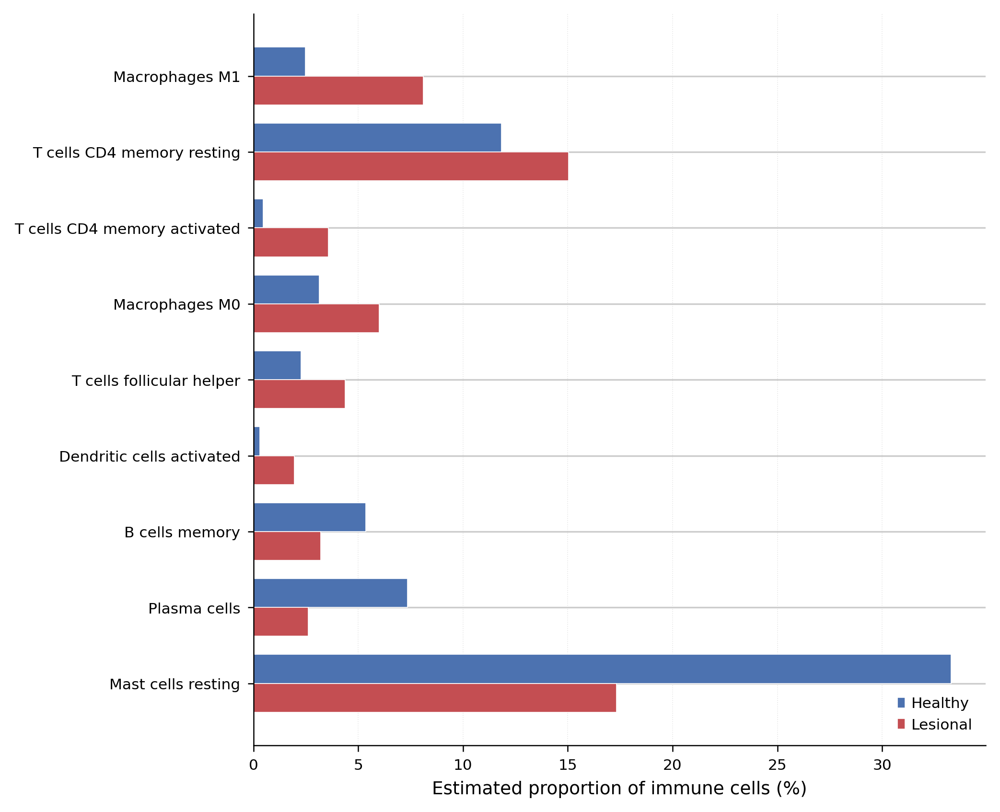

In [ ]:
## Immune-cell composition: significant shifts, healthy vs lesional (CIBERSORT/LM22, GSE14905)
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- the nine FDR-significant cell types only ---
data = [
    ("Macrophages M1",              2.49, 8.11),
    ("T cells CD4 memory activated",0.47, 3.57),
    ("T cells follicular helper",   2.28, 4.38),
    ("Dendritic cells activated",   0.30, 1.96),
    ("Macrophages M0",              3.15, 6.01),
    ("T cells CD4 memory resting", 11.83,15.04),
    ("B cells memory",              5.35, 3.21),
    ("Plasma cells",                7.34, 2.61),
    ("Mast cells resting",         33.28,17.33),
]
df = pd.DataFrame(data, columns=["cell_type", "healthy", "lesional"])
# sort by signed change so up-in-lesional groups at top, down at bottom
df["delta"] = df["lesional"] - df["healthy"]
df = df.sort_values("delta", ascending=True).reset_index(drop=True)

y = np.arange(len(df))
h = 0.38

fig, ax = plt.subplots(figsize=(7.0, 0.5 * len(df) + 1.2))

ax.barh(y + h/2, df["healthy"],  height=h, color="#4C72B0", label="Healthy", edgecolor="white", linewidth=0.4)
ax.barh(y - h/2, df["lesional"], height=h, color="#C44E52", label="Lesional", edgecolor="white", linewidth=0.4)

ax.set_yticks(y)
ax.set_yticklabels(df["cell_type"])
ax.set_xlabel("Estimated proportion of immune cells (%)")
ax.legend(frameon=False, loc="lower right")
ax.spines[["top", "right"]].set_visible(False)
ax.tick_params(length=3, width=0.6)
ax.grid(axis="x", linestyle=":", linewidth=0.4, alpha=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
fig.savefig(f"{FIG_DIR}/immune_deconvolution_significant.pdf", bbox_inches="tight")
fig.savefig(f"{FIG_DIR}/immune_deconvolution_significant.png", dpi=600, bbox_inches="tight")
plt.show()